Name: Audrey Theodora Phang

NIM: 2702343302


# Import Library


In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import json
import tensorflow as tf
from tensorflow.keras.models import Model
import shutil
from PIL import Image
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models, optimizers, Input
from keras.models import load_model
from skimage.transform import resize
from scipy.linalg import sqrtm
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input

SEED_VALUE = 1234
np.random.seed(SEED_VALUE)
import random
random.seed(SEED_VALUE)
tf.random.set_seed(SEED_VALUE)

In [2]:
img_dir = '/kaggle/input/gan-a-23/A_23'
image_size = (100, 100)
all_images = []
all_filenames = []

for fname in os.listdir(img_dir):
    if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
        path = os.path.join(img_dir, fname)
        try:
            img = Image.open(path).convert('RGB').resize(image_size)
            all_images.append(np.array(img))
            all_filenames.append(fname)
        except Exception as e:
            print(f"Error loading {fname}: {e}")

all_images = np.array(all_images) / 255.0

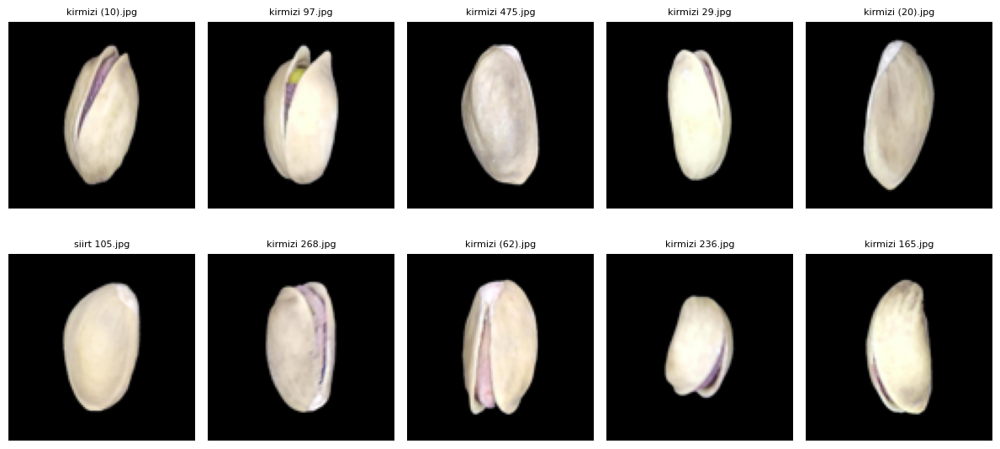

In [3]:
plt.figure(figsize=(12, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(all_images[i])
    plt.title(all_filenames[i], fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [3]:
x_train = np.array(all_images).astype('float32')
x_train = x_train * 2 - 1
BUFFER_SIZE = len(x_train)
batch_size = 100
train_ds = tf.data.Dataset.from_tensor_slices(x_train).shuffle(BUFFER_SIZE).batch(batch_size, drop_remainder=True)

I0000 00:00:1751046689.450751      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


# Baseline Model


In [4]:
noise_dim = 100
IMG_SHAPE = (100, 100, 3)

def build_generator():
    random_input = layers.Input(shape=(noise_dim,))
    x = layers.Dense(106 * 106 * 64, activation='relu')(random_input)
    x = layers.Reshape((106, 106, 64))(x)
    x = layers.Conv2D(16, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Conv2D(32, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Conv2D(64, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Conv2D(3, (3, 3), strides=1, padding='same', activation='tanh')(x)
    return Model(random_input, x, name="generator")


In [6]:
def build_discriminator():
    image_input = layers.Input(shape=IMG_SHAPE)
    x = layers.ZeroPadding2D(padding=(3, 3))(image_input) 
    x = layers.Conv2D(16, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Conv2D(32, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Conv2D(64, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Flatten()(x)
    output = layers.Dense(1, activation='sigmoid')(x)

    discriminator_network = Model(image_input, output, name='discriminator')
    return discriminator_network

In [7]:
generator_network = build_generator()
discriminator_network = build_discriminator()

discriminator_network.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

generator_network.summary()
discriminator_network.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 719104)              │      72,629,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 106, 106, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 104, 104, 16)        │           9,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 102, 102, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 100, 100, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 100, 100, 3)         │           1,731 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,663,603 (277.19 MB)

 Trainable params: 72,663,603 (277.19 MB)

 Non-trainable params: 0 (0.00 B)

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 100, 100, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d (ZeroPadding2D)       │ (None, 106, 106, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 104, 104, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 102, 102, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 100, 100, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 640000)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │         640,001 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 663,585 (2.53 MB)

 Trainable params: 663,585 (2.53 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
discriminator_network.trainable = False  

gan_input = layers.Input(shape=(noise_dim,))
generated_image = generator_network(gan_input)
gan_output = discriminator_network(generated_image)
gan_model = Model(gan_input, gan_output, name='gan')

adam_optimizer_gan = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5)
gan_model.compile(loss='binary_crossentropy', optimizer=adam_optimizer_gan)

gan_model.summary()

Model: "gan"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ generator (Functional)               │ (None, 100, 100, 3)         │      72,663,603 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ discriminator (Functional)           │ (None, 1)                   │         663,585 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 73,327,188 (279.72 MB)

 Trainable params: 72,663,603 (277.19 MB)

 Non-trainable params: 663,585 (2.53 MB)

In [5]:
def get_random_noise(batch_size, noise_dim):
    return np.random.normal(0, 1, size=(batch_size, noise_dim))

Min: -1.0 | Max: 1.0
Sample batch shape: (100, 100, 100, 3)


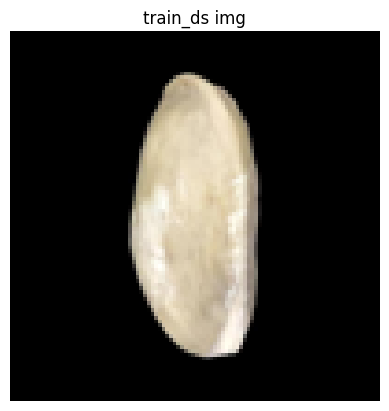

In [6]:
print("Min:", x_train.min(), "| Max:", x_train.max())

sample_batch = next(iter(train_ds))
print("Sample batch shape:", sample_batch.shape)
plt.imshow(((sample_batch[0].numpy() + 1) / 2)) 
plt.axis('off')
plt.title("train_ds img")
plt.show()

In [6]:
def show_generator_results(generator, epoch, noise_dim=100, examples=5):
    noise = get_random_noise(examples, noise_dim)
    gen_images = generator.predict(noise)
    gen_images = 0.5 * gen_images + 0.5 

    plt.figure(figsize=(examples * 2, 2))
    for i in range(examples):
        plt.subplot(1, examples, i + 1)
        plt.imshow(gen_images[i])
        plt.axis('off')
    plt.suptitle(f"Generated images at epoch {epoch}")
    plt.show()

I0000 00:00:1751031541.437496      35 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1751031544.364763      35 service.cc:148] XLA service 0x27371590 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1751031544.365559      35 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1751031552.383320      35 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch 1/400 | D loss: 0.3579 | G loss: 0.7947
Epoch 2/400 | D loss: 0.2223 | G loss: 1.5816
Epoch 3/400 | D loss: 0.1521 | G loss: 2.4887
Epoch 4/400 | D loss: 0.1149 | G loss: 3.2153
Epoch 5/400 | D loss: 0.0925 | G loss: 3.7117
Epoch 6/400 | D loss: 0.0773 | G loss: 4.1963
Epoch 7/400 | D loss: 0.0663 | G loss: 4.6255
Epoch 8/400 | D loss: 0.0581 | G loss: 4.9679
Epoch 9/400 | D loss: 0.0517 | G loss: 5.3180
Epoch 10/400 | D loss: 0.0465 | G loss: 5.6335
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


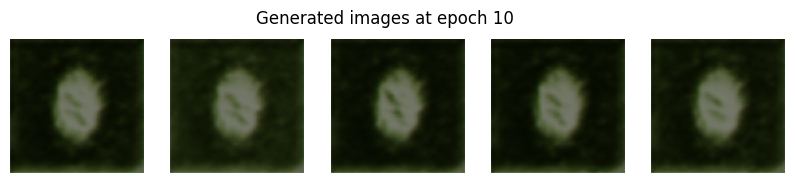

Epoch 11/400 | D loss: 0.0423 | G loss: 5.9015
Epoch 12/400 | D loss: 0.0388 | G loss: 6.1397
Epoch 13/400 | D loss: 0.0358 | G loss: 6.2990
Epoch 14/400 | D loss: 0.0337 | G loss: 6.7099
Epoch 15/400 | D loss: 0.0728 | G loss: 6.6345
Epoch 16/400 | D loss: 0.1313 | G loss: 6.6419
Epoch 17/400 | D loss: 0.2035 | G loss: 6.5007
Epoch 18/400 | D loss: 0.2809 | G loss: 6.2860
Epoch 19/400 | D loss: 0.3249 | G loss: 6.0782
Epoch 20/400 | D loss: 0.3429 | G loss: 5.9020
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


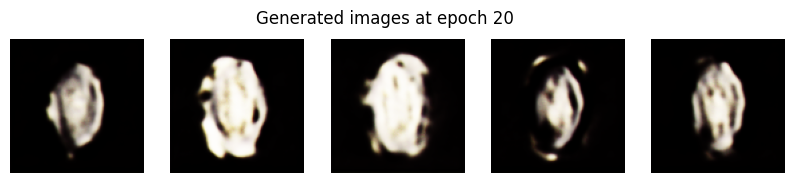

Epoch 21/400 | D loss: 0.3835 | G loss: 5.7182
Epoch 22/400 | D loss: 0.4181 | G loss: 5.5382
Epoch 23/400 | D loss: 0.4403 | G loss: 5.3686
Epoch 24/400 | D loss: 0.4574 | G loss: 5.2114
Epoch 25/400 | D loss: 0.4740 | G loss: 5.0591
Epoch 26/400 | D loss: 0.4858 | G loss: 4.9127
Epoch 27/400 | D loss: 0.4980 | G loss: 4.7820
Epoch 28/400 | D loss: 0.5112 | G loss: 4.6580
Epoch 29/400 | D loss: 0.5205 | G loss: 4.5434
Epoch 30/400 | D loss: 0.5301 | G loss: 4.4338
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


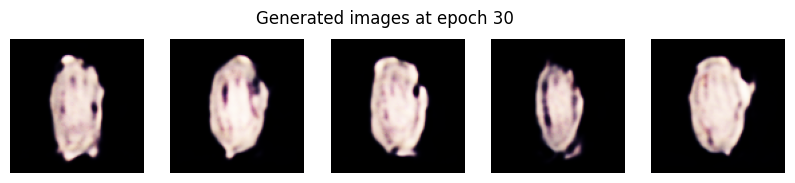

Epoch 31/400 | D loss: 0.5357 | G loss: 4.3330
Epoch 32/400 | D loss: 0.5423 | G loss: 4.2387
Epoch 33/400 | D loss: 0.5504 | G loss: 4.1469
Epoch 34/400 | D loss: 0.5573 | G loss: 4.0610
Epoch 35/400 | D loss: 0.5633 | G loss: 3.9780
Epoch 36/400 | D loss: 0.5684 | G loss: 3.8988
Epoch 37/400 | D loss: 0.5726 | G loss: 3.8248
Epoch 38/400 | D loss: 0.5772 | G loss: 3.7550
Epoch 39/400 | D loss: 0.5812 | G loss: 3.6881
Epoch 40/400 | D loss: 0.5850 | G loss: 3.6238
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


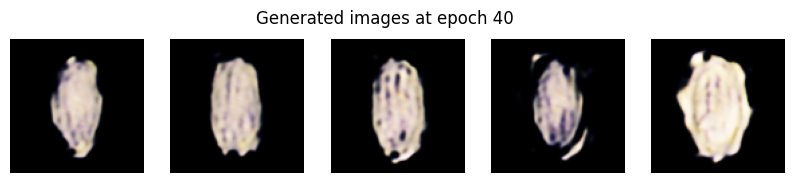

Epoch 41/400 | D loss: 0.5876 | G loss: 3.5628
Epoch 42/400 | D loss: 0.5908 | G loss: 3.5058
Epoch 43/400 | D loss: 0.5940 | G loss: 3.4506
Epoch 44/400 | D loss: 0.5969 | G loss: 3.3980
Epoch 45/400 | D loss: 0.5993 | G loss: 3.3465
Epoch 46/400 | D loss: 0.6020 | G loss: 3.2992
Epoch 47/400 | D loss: 0.6046 | G loss: 3.2527
Epoch 48/400 | D loss: 0.6069 | G loss: 3.2080
Epoch 49/400 | D loss: 0.6094 | G loss: 3.1653
Epoch 50/400 | D loss: 0.6122 | G loss: 3.1230
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


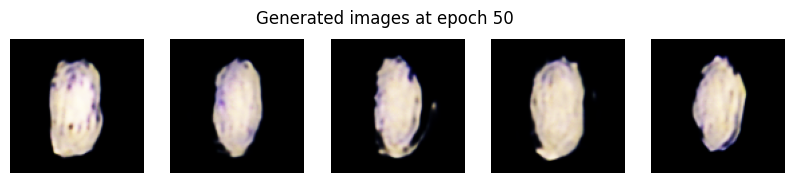

Epoch 51/400 | D loss: 0.6147 | G loss: 3.0827
Epoch 52/400 | D loss: 0.6177 | G loss: 3.0437
Epoch 53/400 | D loss: 0.6204 | G loss: 3.0059
Epoch 54/400 | D loss: 0.6220 | G loss: 2.9699
Epoch 55/400 | D loss: 0.6247 | G loss: 2.9359
Epoch 56/400 | D loss: 0.6260 | G loss: 2.9046
Epoch 57/400 | D loss: 0.6292 | G loss: 2.8705
Epoch 58/400 | D loss: 0.6310 | G loss: 2.8388
Epoch 59/400 | D loss: 0.6335 | G loss: 2.8077
Epoch 60/400 | D loss: 0.6353 | G loss: 2.7775
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


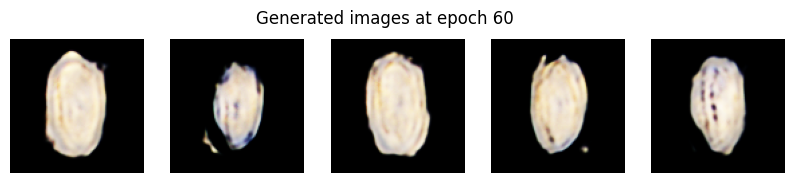

Epoch 61/400 | D loss: 0.6371 | G loss: 2.7475
Epoch 62/400 | D loss: 0.6387 | G loss: 2.7190
Epoch 63/400 | D loss: 0.6406 | G loss: 2.6911
Epoch 64/400 | D loss: 0.6423 | G loss: 2.6639
Epoch 65/400 | D loss: 0.6439 | G loss: 2.6373
Epoch 66/400 | D loss: 0.6453 | G loss: 2.6116
Epoch 67/400 | D loss: 0.6469 | G loss: 2.5872
Epoch 68/400 | D loss: 0.6483 | G loss: 2.5630
Epoch 69/400 | D loss: 0.6496 | G loss: 2.5393
Epoch 70/400 | D loss: 0.6510 | G loss: 2.5167
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


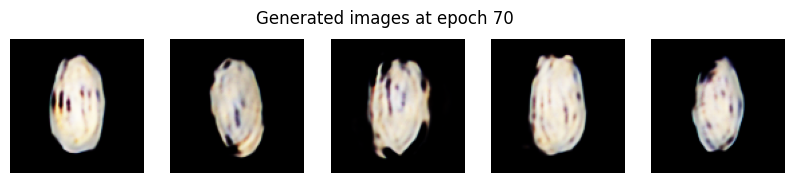

Epoch 71/400 | D loss: 0.6524 | G loss: 2.4943
Epoch 72/400 | D loss: 0.6535 | G loss: 2.4727
Epoch 73/400 | D loss: 0.6548 | G loss: 2.4519
Epoch 74/400 | D loss: 0.6560 | G loss: 2.4310
Epoch 75/400 | D loss: 0.6570 | G loss: 2.4107
Epoch 76/400 | D loss: 0.6582 | G loss: 2.3911
Epoch 77/400 | D loss: 0.6594 | G loss: 2.3717
Epoch 78/400 | D loss: 0.6603 | G loss: 2.3526
Epoch 79/400 | D loss: 0.6613 | G loss: 2.3342
Epoch 80/400 | D loss: 0.6622 | G loss: 2.3165
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


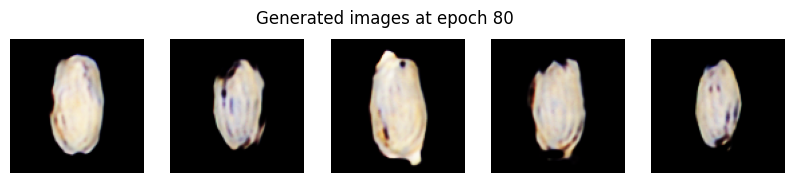

Epoch 81/400 | D loss: 0.6630 | G loss: 2.2989
Epoch 82/400 | D loss: 0.6638 | G loss: 2.2818
Epoch 83/400 | D loss: 0.6645 | G loss: 2.2652
Epoch 84/400 | D loss: 0.6653 | G loss: 2.2488
Epoch 85/400 | D loss: 0.6659 | G loss: 2.2329
Epoch 86/400 | D loss: 0.6666 | G loss: 2.2174
Epoch 87/400 | D loss: 0.6673 | G loss: 2.2023
Epoch 88/400 | D loss: 0.6680 | G loss: 2.1874
Epoch 89/400 | D loss: 0.6687 | G loss: 2.1730
Epoch 90/400 | D loss: 0.6693 | G loss: 2.1589
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


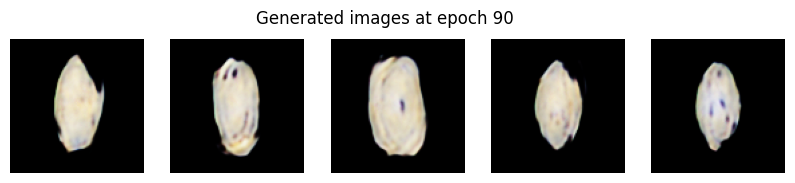

Epoch 91/400 | D loss: 0.6700 | G loss: 2.1449
Epoch 92/400 | D loss: 0.6706 | G loss: 2.1311
Epoch 93/400 | D loss: 0.6713 | G loss: 2.1177
Epoch 94/400 | D loss: 0.6718 | G loss: 2.1046
Epoch 95/400 | D loss: 0.6724 | G loss: 2.0915
Epoch 96/400 | D loss: 0.6728 | G loss: 2.0790
Epoch 97/400 | D loss: 0.6734 | G loss: 2.0667
Epoch 98/400 | D loss: 0.6739 | G loss: 2.0546
Epoch 99/400 | D loss: 0.6744 | G loss: 2.0425
Epoch 100/400 | D loss: 0.6749 | G loss: 2.0309
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


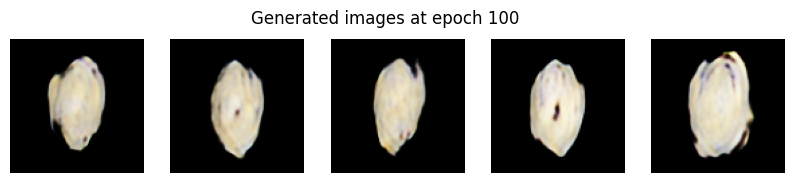

Epoch 101/400 | D loss: 0.6754 | G loss: 2.0194
Epoch 102/400 | D loss: 0.6759 | G loss: 2.0080
Epoch 103/400 | D loss: 0.6763 | G loss: 1.9969
Epoch 104/400 | D loss: 0.6768 | G loss: 1.9861
Epoch 105/400 | D loss: 0.6772 | G loss: 1.9754
Epoch 106/400 | D loss: 0.6777 | G loss: 1.9648
Epoch 107/400 | D loss: 0.6781 | G loss: 1.9545
Epoch 108/400 | D loss: 0.6785 | G loss: 1.9445
Epoch 109/400 | D loss: 0.6788 | G loss: 1.9344
Epoch 110/400 | D loss: 0.6791 | G loss: 1.9246
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


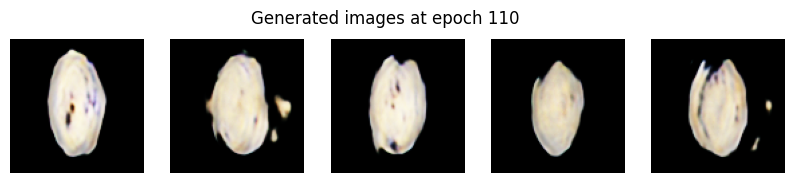

Epoch 111/400 | D loss: 0.6795 | G loss: 1.9151
Epoch 112/400 | D loss: 0.6798 | G loss: 1.9055
Epoch 113/400 | D loss: 0.6803 | G loss: 1.8960
Epoch 114/400 | D loss: 0.6806 | G loss: 1.8867
Epoch 115/400 | D loss: 0.6811 | G loss: 1.8777
Epoch 116/400 | D loss: 0.6815 | G loss: 1.8688
Epoch 117/400 | D loss: 0.6819 | G loss: 1.8599
Epoch 118/400 | D loss: 0.6822 | G loss: 1.8512
Epoch 119/400 | D loss: 0.6826 | G loss: 1.8427
Epoch 120/400 | D loss: 0.6830 | G loss: 1.8342
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


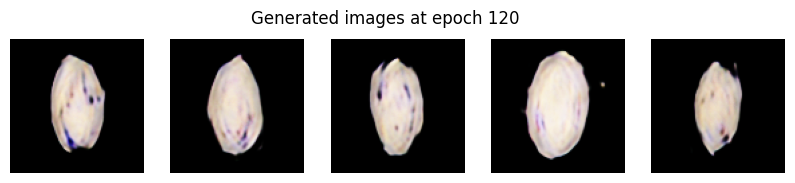

Epoch 121/400 | D loss: 0.6833 | G loss: 1.8260
Epoch 122/400 | D loss: 0.6837 | G loss: 1.8178
Epoch 123/400 | D loss: 0.6840 | G loss: 1.8097
Epoch 124/400 | D loss: 0.6843 | G loss: 1.8017
Epoch 125/400 | D loss: 0.6846 | G loss: 1.7938
Epoch 126/400 | D loss: 0.6849 | G loss: 1.7863
Epoch 127/400 | D loss: 0.6851 | G loss: 1.7786
Epoch 128/400 | D loss: 0.6854 | G loss: 1.7711
Epoch 129/400 | D loss: 0.6857 | G loss: 1.7638
Epoch 130/400 | D loss: 0.6859 | G loss: 1.7566
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


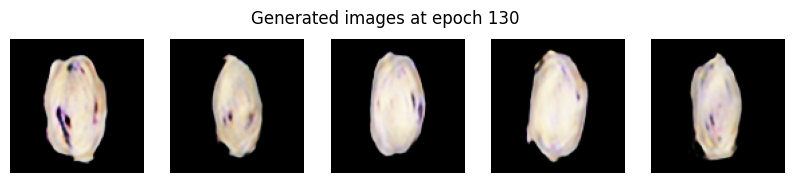

Epoch 131/400 | D loss: 0.6861 | G loss: 1.7494
Epoch 132/400 | D loss: 0.6864 | G loss: 1.7423
Epoch 133/400 | D loss: 0.6866 | G loss: 1.7353
Epoch 134/400 | D loss: 0.6868 | G loss: 1.7285
Epoch 135/400 | D loss: 0.6870 | G loss: 1.7216
Epoch 136/400 | D loss: 0.6872 | G loss: 1.7150
Epoch 137/400 | D loss: 0.6874 | G loss: 1.7084
Epoch 138/400 | D loss: 0.6875 | G loss: 1.7020
Epoch 139/400 | D loss: 0.6877 | G loss: 1.6956
Epoch 140/400 | D loss: 0.6879 | G loss: 1.6893
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


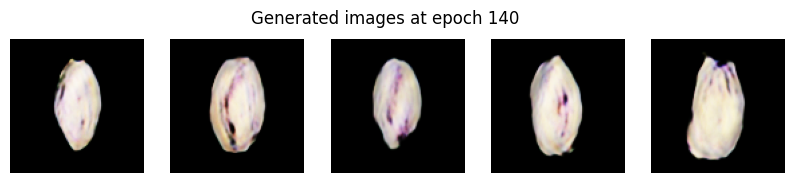

Epoch 141/400 | D loss: 0.6880 | G loss: 1.6831
Epoch 142/400 | D loss: 0.6882 | G loss: 1.6771
Epoch 143/400 | D loss: 0.6883 | G loss: 1.6710
Epoch 144/400 | D loss: 0.6884 | G loss: 1.6651
Epoch 145/400 | D loss: 0.6886 | G loss: 1.6593
Epoch 146/400 | D loss: 0.6887 | G loss: 1.6534
Epoch 147/400 | D loss: 0.6888 | G loss: 1.6478
Epoch 148/400 | D loss: 0.6890 | G loss: 1.6422
Epoch 149/400 | D loss: 0.6891 | G loss: 1.6366
Epoch 150/400 | D loss: 0.6893 | G loss: 1.6312
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


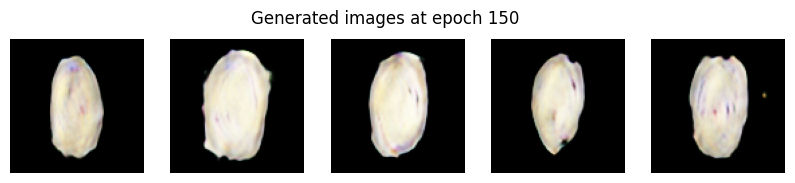

Epoch 151/400 | D loss: 0.6894 | G loss: 1.6259
Epoch 152/400 | D loss: 0.6896 | G loss: 1.6206
Epoch 153/400 | D loss: 0.6897 | G loss: 1.6153
Epoch 154/400 | D loss: 0.6899 | G loss: 1.6102
Epoch 155/400 | D loss: 0.6900 | G loss: 1.6051
Epoch 156/400 | D loss: 0.6901 | G loss: 1.6000
Epoch 157/400 | D loss: 0.6902 | G loss: 1.5949
Epoch 158/400 | D loss: 0.6902 | G loss: 1.5900
Epoch 159/400 | D loss: 0.6903 | G loss: 1.5850
Epoch 160/400 | D loss: 0.6904 | G loss: 1.5802
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


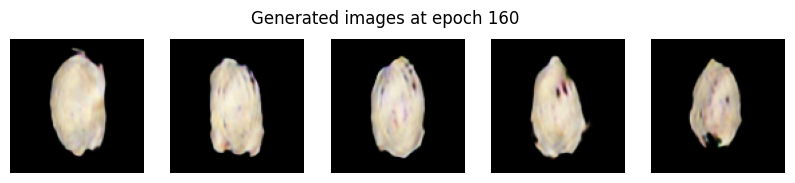

Epoch 161/400 | D loss: 0.6905 | G loss: 1.5754
Epoch 162/400 | D loss: 0.6906 | G loss: 1.5706
Epoch 163/400 | D loss: 0.6907 | G loss: 1.5660
Epoch 164/400 | D loss: 0.6908 | G loss: 1.5613
Epoch 165/400 | D loss: 0.6908 | G loss: 1.5567
Epoch 166/400 | D loss: 0.6909 | G loss: 1.5522
Epoch 167/400 | D loss: 0.6909 | G loss: 1.5478
Epoch 168/400 | D loss: 0.6910 | G loss: 1.5435
Epoch 169/400 | D loss: 0.6910 | G loss: 1.5391
Epoch 170/400 | D loss: 0.6911 | G loss: 1.5349
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


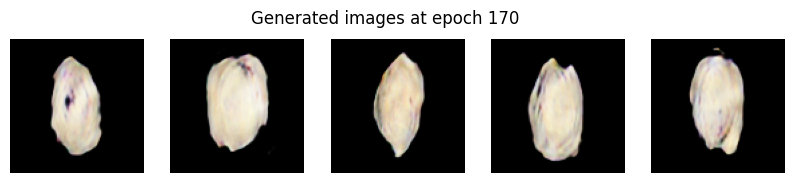

Epoch 171/400 | D loss: 0.6912 | G loss: 1.5306
Epoch 172/400 | D loss: 0.6912 | G loss: 1.5264
Epoch 173/400 | D loss: 0.6913 | G loss: 1.5222
Epoch 174/400 | D loss: 0.6913 | G loss: 1.5181
Epoch 175/400 | D loss: 0.6914 | G loss: 1.5141
Epoch 176/400 | D loss: 0.6915 | G loss: 1.5101
Epoch 177/400 | D loss: 0.6915 | G loss: 1.5061
Epoch 178/400 | D loss: 0.6916 | G loss: 1.5022
Epoch 179/400 | D loss: 0.6916 | G loss: 1.4983
Epoch 180/400 | D loss: 0.6917 | G loss: 1.4944
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


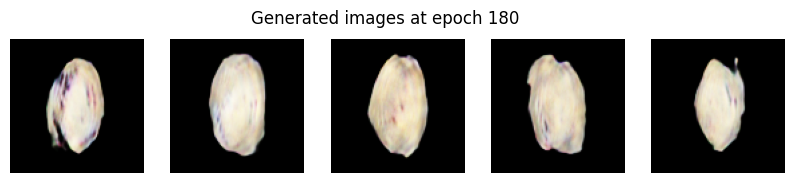

Epoch 181/400 | D loss: 0.6917 | G loss: 1.4906
Epoch 182/400 | D loss: 0.6918 | G loss: 1.4869
Epoch 183/400 | D loss: 0.6918 | G loss: 1.4832
Epoch 184/400 | D loss: 0.6919 | G loss: 1.4796
Epoch 185/400 | D loss: 0.6919 | G loss: 1.4759
Epoch 186/400 | D loss: 0.6919 | G loss: 1.4723
Epoch 187/400 | D loss: 0.6920 | G loss: 1.4687
Epoch 188/400 | D loss: 0.6920 | G loss: 1.4652
Epoch 189/400 | D loss: 0.6921 | G loss: 1.4617
Epoch 190/400 | D loss: 0.6921 | G loss: 1.4582
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


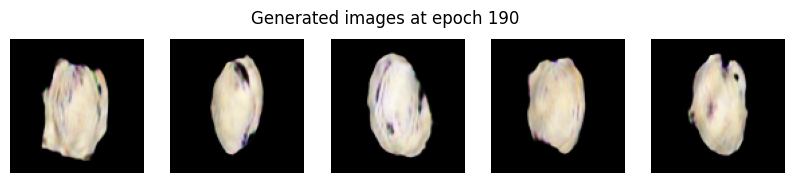

Epoch 191/400 | D loss: 0.6921 | G loss: 1.4547
Epoch 192/400 | D loss: 0.6922 | G loss: 1.4513
Epoch 193/400 | D loss: 0.6922 | G loss: 1.4480
Epoch 194/400 | D loss: 0.6922 | G loss: 1.4446
Epoch 195/400 | D loss: 0.6922 | G loss: 1.4413
Epoch 196/400 | D loss: 0.6923 | G loss: 1.4381
Epoch 197/400 | D loss: 0.6923 | G loss: 1.4349
Epoch 198/400 | D loss: 0.6923 | G loss: 1.4317
Epoch 199/400 | D loss: 0.6924 | G loss: 1.4285
Epoch 200/400 | D loss: 0.6924 | G loss: 1.4253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


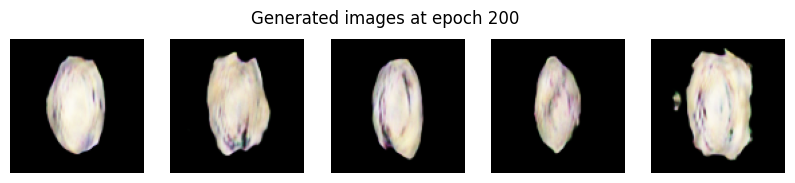

Epoch 201/400 | D loss: 0.6924 | G loss: 1.4222
Epoch 202/400 | D loss: 0.6924 | G loss: 1.4191
Epoch 203/400 | D loss: 0.6923 | G loss: 1.4161
Epoch 204/400 | D loss: 0.6923 | G loss: 1.4131
Epoch 205/400 | D loss: 0.6924 | G loss: 1.4102
Epoch 206/400 | D loss: 0.6924 | G loss: 1.4072
Epoch 207/400 | D loss: 0.6924 | G loss: 1.4043
Epoch 208/400 | D loss: 0.6923 | G loss: 1.4014
Epoch 209/400 | D loss: 0.6923 | G loss: 1.3985
Epoch 210/400 | D loss: 0.6923 | G loss: 1.3956
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


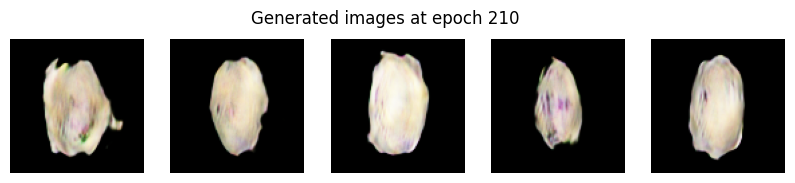

Epoch 211/400 | D loss: 0.6923 | G loss: 1.3928
Epoch 212/400 | D loss: 0.6923 | G loss: 1.3900
Epoch 213/400 | D loss: 0.6923 | G loss: 1.3872
Epoch 214/400 | D loss: 0.6923 | G loss: 1.3845
Epoch 215/400 | D loss: 0.6923 | G loss: 1.3817
Epoch 216/400 | D loss: 0.6923 | G loss: 1.3790
Epoch 217/400 | D loss: 0.6923 | G loss: 1.3764
Epoch 218/400 | D loss: 0.6922 | G loss: 1.3737
Epoch 219/400 | D loss: 0.6922 | G loss: 1.3710
Epoch 220/400 | D loss: 0.6922 | G loss: 1.3685
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


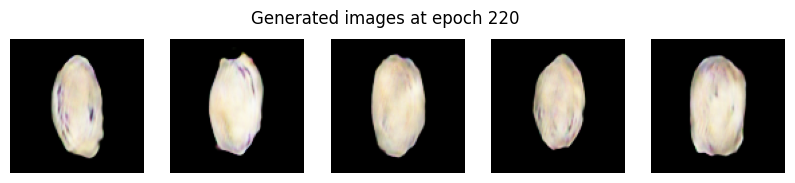

Epoch 221/400 | D loss: 0.6922 | G loss: 1.3659
Epoch 222/400 | D loss: 0.6922 | G loss: 1.3633
Epoch 223/400 | D loss: 0.6922 | G loss: 1.3608
Epoch 224/400 | D loss: 0.6922 | G loss: 1.3583
Epoch 225/400 | D loss: 0.6921 | G loss: 1.3558
Epoch 226/400 | D loss: 0.6921 | G loss: 1.3533
Epoch 227/400 | D loss: 0.6921 | G loss: 1.3508
Epoch 228/400 | D loss: 0.6920 | G loss: 1.3484
Epoch 229/400 | D loss: 0.6921 | G loss: 1.3461
Epoch 230/400 | D loss: 0.6921 | G loss: 1.3437
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


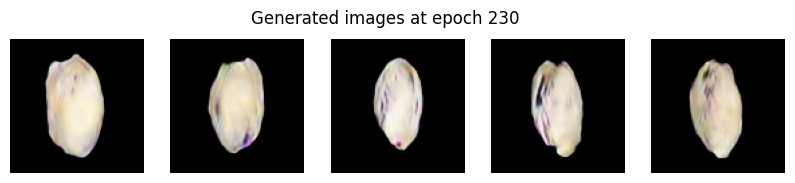

Epoch 231/400 | D loss: 0.6920 | G loss: 1.3413
Epoch 232/400 | D loss: 0.6920 | G loss: 1.3390
Epoch 233/400 | D loss: 0.6920 | G loss: 1.3367
Epoch 234/400 | D loss: 0.6920 | G loss: 1.3344
Epoch 235/400 | D loss: 0.6919 | G loss: 1.3321
Epoch 236/400 | D loss: 0.6919 | G loss: 1.3298
Epoch 237/400 | D loss: 0.6919 | G loss: 1.3275
Epoch 238/400 | D loss: 0.6918 | G loss: 1.3253
Epoch 239/400 | D loss: 0.6918 | G loss: 1.3231
Epoch 240/400 | D loss: 0.6918 | G loss: 1.3209
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


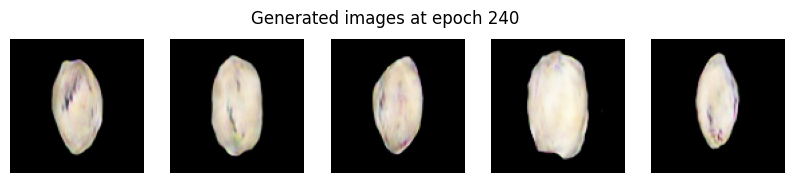

Epoch 241/400 | D loss: 0.6917 | G loss: 1.3187
Epoch 242/400 | D loss: 0.6917 | G loss: 1.3165
Epoch 243/400 | D loss: 0.6917 | G loss: 1.3144
Epoch 244/400 | D loss: 0.6916 | G loss: 1.3123
Epoch 245/400 | D loss: 0.6916 | G loss: 1.3103
Epoch 246/400 | D loss: 0.6915 | G loss: 1.3082
Epoch 247/400 | D loss: 0.6915 | G loss: 1.3061
Epoch 248/400 | D loss: 0.6914 | G loss: 1.3041
Epoch 249/400 | D loss: 0.6914 | G loss: 1.3020
Epoch 250/400 | D loss: 0.6913 | G loss: 1.3000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


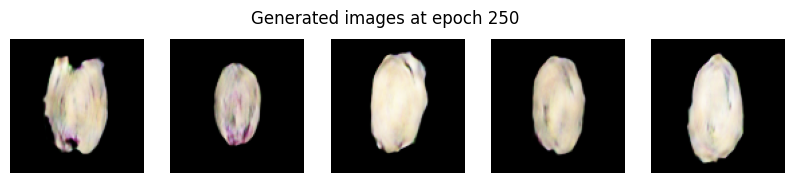

Epoch 251/400 | D loss: 0.6913 | G loss: 1.2980
Epoch 252/400 | D loss: 0.6912 | G loss: 1.2961
Epoch 253/400 | D loss: 0.6912 | G loss: 1.2941
Epoch 254/400 | D loss: 0.6911 | G loss: 1.2921
Epoch 255/400 | D loss: 0.6911 | G loss: 1.2902
Epoch 256/400 | D loss: 0.6910 | G loss: 1.2883
Epoch 257/400 | D loss: 0.6910 | G loss: 1.2864
Epoch 258/400 | D loss: 0.6909 | G loss: 1.2845
Epoch 259/400 | D loss: 0.6909 | G loss: 1.2826
Epoch 260/400 | D loss: 0.6908 | G loss: 1.2808
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


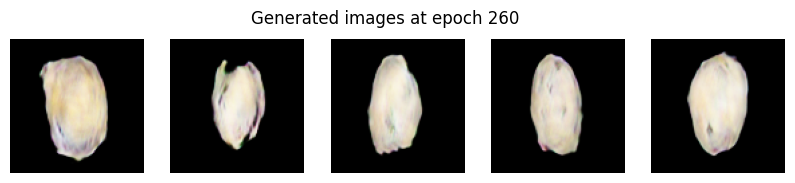

Epoch 261/400 | D loss: 0.6908 | G loss: 1.2790
Epoch 262/400 | D loss: 0.6908 | G loss: 1.2771
Epoch 263/400 | D loss: 0.6907 | G loss: 1.2753
Epoch 264/400 | D loss: 0.6907 | G loss: 1.2735
Epoch 265/400 | D loss: 0.6906 | G loss: 1.2718
Epoch 266/400 | D loss: 0.6905 | G loss: 1.2700
Epoch 267/400 | D loss: 0.6905 | G loss: 1.2682
Epoch 268/400 | D loss: 0.6904 | G loss: 1.2664
Epoch 269/400 | D loss: 0.6904 | G loss: 1.2647
Epoch 270/400 | D loss: 0.6903 | G loss: 1.2630
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


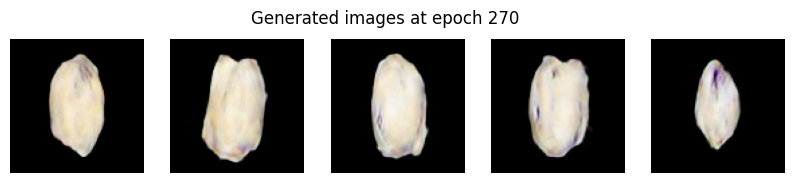

Epoch 271/400 | D loss: 0.6903 | G loss: 1.2613
Epoch 272/400 | D loss: 0.6902 | G loss: 1.2596
Epoch 273/400 | D loss: 0.6901 | G loss: 1.2579
Epoch 274/400 | D loss: 0.6901 | G loss: 1.2562
Epoch 275/400 | D loss: 0.6900 | G loss: 1.2545
Epoch 276/400 | D loss: 0.6900 | G loss: 1.2529
Epoch 277/400 | D loss: 0.6899 | G loss: 1.2512
Epoch 278/400 | D loss: 0.6899 | G loss: 1.2496
Epoch 279/400 | D loss: 0.6898 | G loss: 1.2480
Epoch 280/400 | D loss: 0.6898 | G loss: 1.2464
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


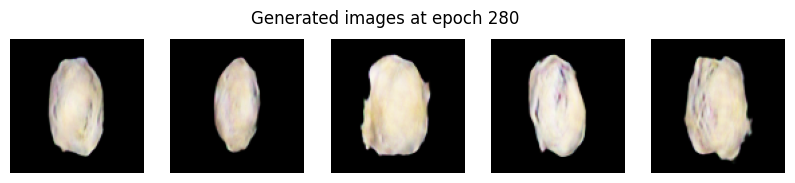

Epoch 281/400 | D loss: 0.6897 | G loss: 1.2448
Epoch 282/400 | D loss: 0.6896 | G loss: 1.2432
Epoch 283/400 | D loss: 0.6896 | G loss: 1.2416
Epoch 284/400 | D loss: 0.6895 | G loss: 1.2400
Epoch 285/400 | D loss: 0.6895 | G loss: 1.2385
Epoch 286/400 | D loss: 0.6894 | G loss: 1.2370
Epoch 287/400 | D loss: 0.6893 | G loss: 1.2355
Epoch 288/400 | D loss: 0.6892 | G loss: 1.2340
Epoch 289/400 | D loss: 0.6892 | G loss: 1.2324
Epoch 290/400 | D loss: 0.6891 | G loss: 1.2309
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


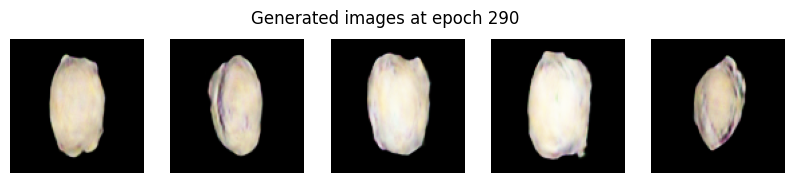

Epoch 291/400 | D loss: 0.6890 | G loss: 1.2295
Epoch 292/400 | D loss: 0.6890 | G loss: 1.2280
Epoch 293/400 | D loss: 0.6889 | G loss: 1.2265
Epoch 294/400 | D loss: 0.6888 | G loss: 1.2251
Epoch 295/400 | D loss: 0.6888 | G loss: 1.2236
Epoch 296/400 | D loss: 0.6887 | G loss: 1.2222
Epoch 297/400 | D loss: 0.6887 | G loss: 1.2208
Epoch 298/400 | D loss: 0.6886 | G loss: 1.2194
Epoch 299/400 | D loss: 0.6885 | G loss: 1.2180
Epoch 300/400 | D loss: 0.6885 | G loss: 1.2166
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


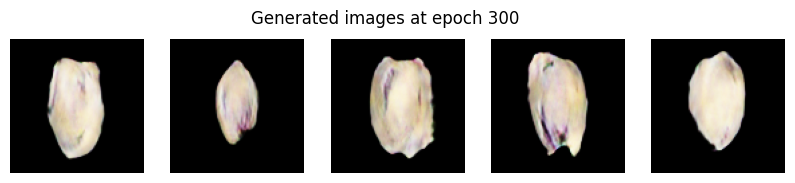

Epoch 301/400 | D loss: 0.6884 | G loss: 1.2152
Epoch 302/400 | D loss: 0.6883 | G loss: 1.2139
Epoch 303/400 | D loss: 0.6883 | G loss: 1.2126
Epoch 304/400 | D loss: 0.6882 | G loss: 1.2112
Epoch 305/400 | D loss: 0.6881 | G loss: 1.2099
Epoch 306/400 | D loss: 0.6881 | G loss: 1.2085
Epoch 307/400 | D loss: 0.6880 | G loss: 1.2072
Epoch 308/400 | D loss: 0.6879 | G loss: 1.2059
Epoch 309/400 | D loss: 0.6879 | G loss: 1.2046
Epoch 310/400 | D loss: 0.6878 | G loss: 1.2033
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


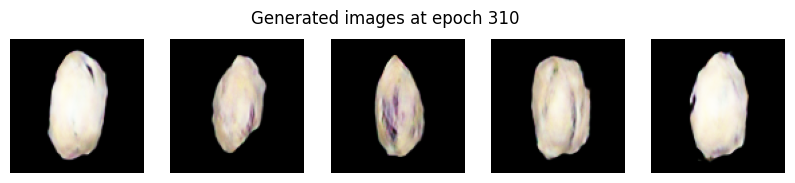

Epoch 311/400 | D loss: 0.6877 | G loss: 1.2020
Epoch 312/400 | D loss: 0.6877 | G loss: 1.2007
Epoch 313/400 | D loss: 0.6876 | G loss: 1.1994
Epoch 314/400 | D loss: 0.6875 | G loss: 1.1982
Epoch 315/400 | D loss: 0.6875 | G loss: 1.1969
Epoch 316/400 | D loss: 0.6874 | G loss: 1.1957
Epoch 317/400 | D loss: 0.6873 | G loss: 1.1944
Epoch 318/400 | D loss: 0.6873 | G loss: 1.1932
Epoch 319/400 | D loss: 0.6872 | G loss: 1.1920
Epoch 320/400 | D loss: 0.6871 | G loss: 1.1907
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


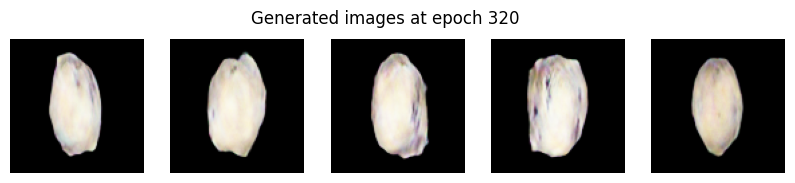

Epoch 321/400 | D loss: 0.6871 | G loss: 1.1895
Epoch 322/400 | D loss: 0.6870 | G loss: 1.1883
Epoch 323/400 | D loss: 0.6870 | G loss: 1.1871
Epoch 324/400 | D loss: 0.6869 | G loss: 1.1859
Epoch 325/400 | D loss: 0.6868 | G loss: 1.1847
Epoch 326/400 | D loss: 0.6868 | G loss: 1.1836
Epoch 327/400 | D loss: 0.6867 | G loss: 1.1824
Epoch 328/400 | D loss: 0.6866 | G loss: 1.1812
Epoch 329/400 | D loss: 0.6866 | G loss: 1.1801
Epoch 330/400 | D loss: 0.6865 | G loss: 1.1789
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


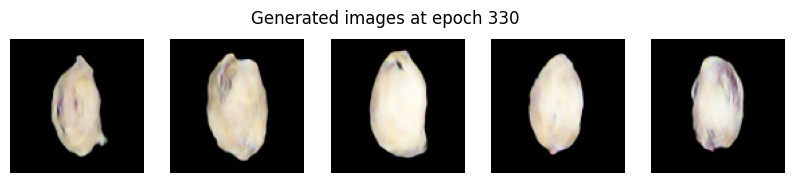

Epoch 331/400 | D loss: 0.6864 | G loss: 1.1777
Epoch 332/400 | D loss: 0.6864 | G loss: 1.1766
Epoch 333/400 | D loss: 0.6863 | G loss: 1.1755
Epoch 334/400 | D loss: 0.6862 | G loss: 1.1744
Epoch 335/400 | D loss: 0.6862 | G loss: 1.1732
Epoch 336/400 | D loss: 0.6861 | G loss: 1.1721
Epoch 337/400 | D loss: 0.6860 | G loss: 1.1710
Epoch 338/400 | D loss: 0.6860 | G loss: 1.1699
Epoch 339/400 | D loss: 0.6859 | G loss: 1.1688
Epoch 340/400 | D loss: 0.6858 | G loss: 1.1677
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


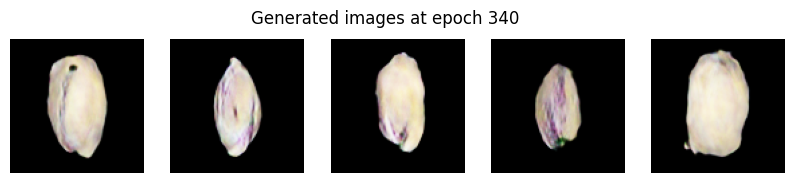

Epoch 341/400 | D loss: 0.6858 | G loss: 1.1666
Epoch 342/400 | D loss: 0.6857 | G loss: 1.1655
Epoch 343/400 | D loss: 0.6857 | G loss: 1.1645
Epoch 344/400 | D loss: 0.6856 | G loss: 1.1634
Epoch 345/400 | D loss: 0.6855 | G loss: 1.1623
Epoch 346/400 | D loss: 0.6855 | G loss: 1.1613
Epoch 347/400 | D loss: 0.6854 | G loss: 1.1602
Epoch 348/400 | D loss: 0.6853 | G loss: 1.1592
Epoch 349/400 | D loss: 0.6853 | G loss: 1.1582
Epoch 350/400 | D loss: 0.6852 | G loss: 1.1572
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


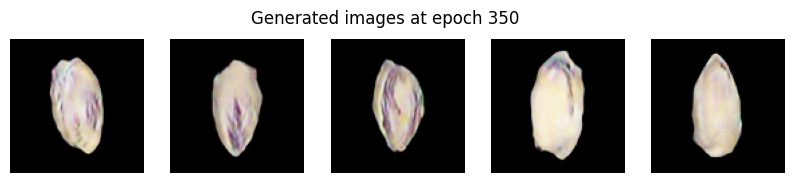

Epoch 351/400 | D loss: 0.6851 | G loss: 1.1562
Epoch 352/400 | D loss: 0.6851 | G loss: 1.1551
Epoch 353/400 | D loss: 0.6850 | G loss: 1.1541
Epoch 354/400 | D loss: 0.6849 | G loss: 1.1531
Epoch 355/400 | D loss: 0.6849 | G loss: 1.1521
Epoch 356/400 | D loss: 0.6848 | G loss: 1.1511
Epoch 357/400 | D loss: 0.6847 | G loss: 1.1501
Epoch 358/400 | D loss: 0.6847 | G loss: 1.1492
Epoch 359/400 | D loss: 0.6846 | G loss: 1.1482
Epoch 360/400 | D loss: 0.6845 | G loss: 1.1472
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


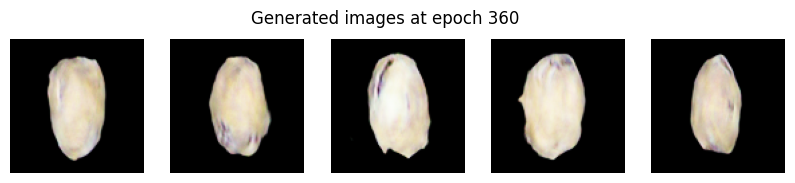

Epoch 361/400 | D loss: 0.6845 | G loss: 1.1463
Epoch 362/400 | D loss: 0.6844 | G loss: 1.1453
Epoch 363/400 | D loss: 0.6843 | G loss: 1.1444
Epoch 364/400 | D loss: 0.6843 | G loss: 1.1434
Epoch 365/400 | D loss: 0.6842 | G loss: 1.1425
Epoch 366/400 | D loss: 0.6841 | G loss: 1.1415
Epoch 367/400 | D loss: 0.6841 | G loss: 1.1406
Epoch 368/400 | D loss: 0.6840 | G loss: 1.1397
Epoch 369/400 | D loss: 0.6839 | G loss: 1.1388
Epoch 370/400 | D loss: 0.6839 | G loss: 1.1378
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


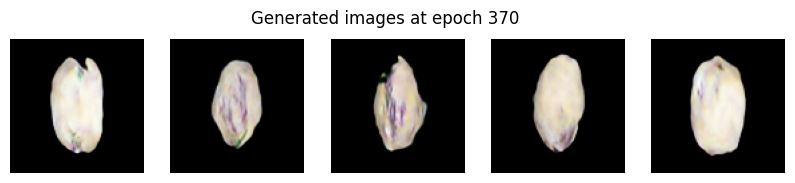

Epoch 371/400 | D loss: 0.6838 | G loss: 1.1369
Epoch 372/400 | D loss: 0.6837 | G loss: 1.1360
Epoch 373/400 | D loss: 0.6837 | G loss: 1.1351
Epoch 374/400 | D loss: 0.6836 | G loss: 1.1342
Epoch 375/400 | D loss: 0.6835 | G loss: 1.1333
Epoch 376/400 | D loss: 0.6835 | G loss: 1.1324
Epoch 377/400 | D loss: 0.6834 | G loss: 1.1316
Epoch 378/400 | D loss: 0.6833 | G loss: 1.1307
Epoch 379/400 | D loss: 0.6833 | G loss: 1.1298
Epoch 380/400 | D loss: 0.6832 | G loss: 1.1289
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


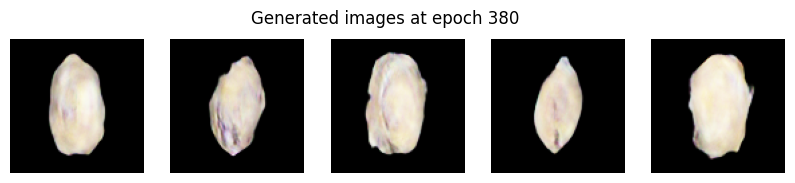

Epoch 381/400 | D loss: 0.6831 | G loss: 1.1281
Epoch 382/400 | D loss: 0.6831 | G loss: 1.1273
Epoch 383/400 | D loss: 0.6830 | G loss: 1.1264
Epoch 384/400 | D loss: 0.6829 | G loss: 1.1255
Epoch 385/400 | D loss: 0.6829 | G loss: 1.1247
Epoch 386/400 | D loss: 0.6828 | G loss: 1.1238
Epoch 387/400 | D loss: 0.6827 | G loss: 1.1230
Epoch 388/400 | D loss: 0.6827 | G loss: 1.1222
Epoch 389/400 | D loss: 0.6826 | G loss: 1.1213
Epoch 390/400 | D loss: 0.6825 | G loss: 1.1205
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


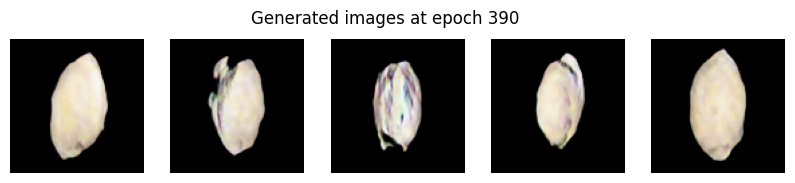

Epoch 391/400 | D loss: 0.6825 | G loss: 1.1197
Epoch 392/400 | D loss: 0.6824 | G loss: 1.1189
Epoch 393/400 | D loss: 0.6823 | G loss: 1.1181
Epoch 394/400 | D loss: 0.6822 | G loss: 1.1173
Epoch 395/400 | D loss: 0.6822 | G loss: 1.1165
Epoch 396/400 | D loss: 0.6821 | G loss: 1.1157
Epoch 397/400 | D loss: 0.6820 | G loss: 1.1149
Epoch 398/400 | D loss: 0.6819 | G loss: 1.1141
Epoch 399/400 | D loss: 0.6819 | G loss: 1.1133
Epoch 400/400 | D loss: 0.6818 | G loss: 1.1126
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


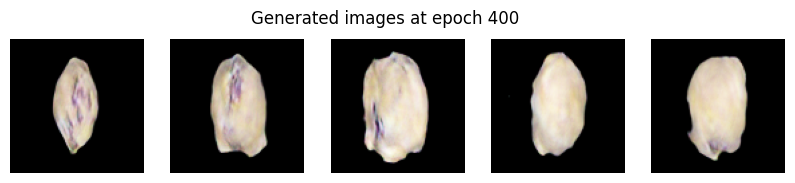

In [12]:
epochs = 400

losses_d = []
losses_g = []

for epoch in range(epochs):
    for real_imgs in train_ds:
        noise = get_random_noise(batch_size, noise_dim)
        fake_imgs = generator_network(noise, training=True)

        real_labels = np.ones((real_imgs.shape[0], 1))
        fake_labels = np.zeros((fake_imgs.shape[0], 1))

        discriminator_network.trainable = True
        d_loss_real = discriminator_network.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator_network.train_on_batch(fake_imgs, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        noise = get_random_noise(batch_size, noise_dim)
        misleading_labels = np.ones((batch_size, 1))
        discriminator_network.trainable = False
        g_loss = gan_model.train_on_batch(noise, misleading_labels)

    losses_d.append(d_loss[0])
    losses_g.append(g_loss)

    print(f"Epoch {epoch+1}/{epochs} | D loss: {d_loss[0]:.4f} | G loss: {g_loss:.4f}")
    if (epoch + 1) % 10 == 0:
        show_generator_results(generator_network, epoch + 1)

In [15]:
history_dict = {
    "d_loss": [float(v) for v in losses_d],
    "g_loss": [float(v) for v in losses_g]
}

with open("baseline_history.json", "w") as f:
    json.dump(history_dict, f)

In [16]:
generator_network.save('generator_baseline.keras')
discriminator_network.save('discriminator_baseline.keras')

# Modified Model

Menambahkan Dropout sebesar 0.3 di setiap layernya


In [29]:
def generator_modif():
    random_input = layers.Input(shape=(noise_dim,))
    x = layers.Dense(106 * 106 * 64, activation='relu')(random_input)
    x = layers.Reshape((106, 106, 64))(x)
    x = layers.Conv2D(16, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Conv2D(32, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Conv2D(64, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Conv2D(3, (3, 3), strides=1, padding='same', activation='tanh')(x)
    return Model(random_input, x, name="generator")

In [30]:
def discriminator_modif():
    image_input = layers.Input(shape=IMG_SHAPE)
    x = layers.ZeroPadding2D(padding=(3, 3))(image_input)
    x = layers.Conv2D(16, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Conv2D(32, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Conv2D(64, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Flatten()(x)
    output = layers.Dense(1, activation='sigmoid')(x)
    return Model(image_input, output, name='discriminator')


In [31]:
generator_network2 = generator_modif()
discriminator_network2 = discriminator_modif()

discriminator_network2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

generator_network2.summary()
discriminator_network2.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)          │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 719104)              │      72,629,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_5 (Reshape)                  │ (None, 106, 106, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_129 (Conv2D)                  │ (None, 104, 104, 16)        │           9,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_20 (Dropout)                 │ (None, 104, 104, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_130 (Conv2D)                  │ (None, 102, 102, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_21 (Dropout)                 │ (None, 102, 102, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_131 (Conv2D)                  │ (None, 100, 100, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_22 (Dropout)                 │ (None, 100, 100, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_132 (Conv2D)                  │ (None, 100, 100, 3)         │           1,731 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,663,603 (277.19 MB)

 Trainable params: 72,663,603 (277.19 MB)

 Non-trainable params: 0 (0.00 B)

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)          │ (None, 100, 100, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d_5 (ZeroPadding2D)     │ (None, 106, 106, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_133 (Conv2D)                  │ (None, 104, 104, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_23 (Dropout)                 │ (None, 104, 104, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_134 (Conv2D)                  │ (None, 102, 102, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_24 (Dropout)                 │ (None, 102, 102, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_135 (Conv2D)                  │ (None, 100, 100, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_25 (Dropout)                 │ (None, 100, 100, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 640000)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │         640,001 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 663,585 (2.53 MB)

 Trainable params: 663,585 (2.53 MB)

 Non-trainable params: 0 (0.00 B)

In [32]:
discriminator_network2.trainable = False  

gan_input2 = layers.Input(shape=(noise_dim,))
generated_image2 = generator_network2(gan_input2) 
gan_output2 = discriminator_network2(generated_image2)
gan_model2 = Model(gan_input2, gan_output2, name='gan_model2')

adam_optimizer_gan = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5)
gan_model2.compile(loss='binary_crossentropy', optimizer=adam_optimizer_gan)

gan_model2.summary()

Model: "gan_model2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)          │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ generator (Functional)               │ (None, 100, 100, 3)         │      72,663,603 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ discriminator (Functional)           │ (None, 1)                   │         663,585 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 73,327,188 (279.72 MB)

 Trainable params: 72,663,603 (277.19 MB)

 Non-trainable params: 663,585 (2.53 MB)

Epoch 1/400 | D loss: 0.3925 | G loss: 0.6638
Epoch 2/400 | D loss: 0.3394 | G loss: 0.7853
Epoch 3/400 | D loss: 0.2655 | G loss: 1.1286
Epoch 4/400 | D loss: 0.2098 | G loss: 1.5846
Epoch 5/400 | D loss: 0.1722 | G loss: 2.0470
Epoch 6/400 | D loss: 0.2457 | G loss: 2.6246
Epoch 7/400 | D loss: 0.2291 | G loss: 3.0964
Epoch 8/400 | D loss: 0.2010 | G loss: 3.3894
Epoch 9/400 | D loss: 0.1797 | G loss: 3.5927
Epoch 10/400 | D loss: 0.1641 | G loss: 3.7581
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


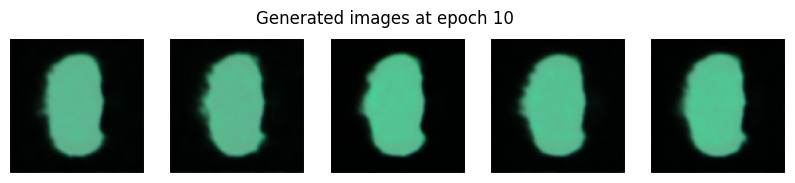

Epoch 11/400 | D loss: 0.2787 | G loss: 4.3211
Epoch 12/400 | D loss: 0.2586 | G loss: 4.3888
Epoch 13/400 | D loss: 0.2601 | G loss: 4.6325
Epoch 14/400 | D loss: 0.3053 | G loss: 4.9657
Epoch 15/400 | D loss: 0.5799 | G loss: 4.9319
Epoch 16/400 | D loss: 0.7360 | G loss: 4.7573
Epoch 17/400 | D loss: 0.8060 | G loss: 4.5902
Epoch 18/400 | D loss: 0.8414 | G loss: 4.4301
Epoch 19/400 | D loss: 0.8674 | G loss: 4.2849
Epoch 20/400 | D loss: 0.8945 | G loss: 4.1435
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


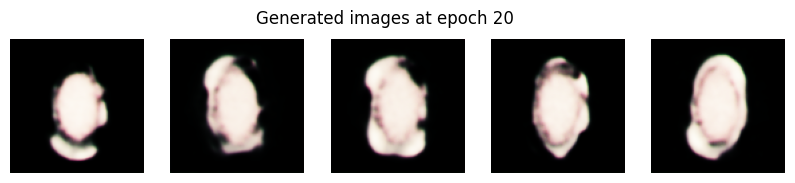

Epoch 21/400 | D loss: 0.9121 | G loss: 4.0068
Epoch 22/400 | D loss: 0.9154 | G loss: 3.8852
Epoch 23/400 | D loss: 0.9176 | G loss: 3.7741
Epoch 24/400 | D loss: 0.9217 | G loss: 3.6684
Epoch 25/400 | D loss: 0.9266 | G loss: 3.5691
Epoch 26/400 | D loss: 0.9305 | G loss: 3.4762
Epoch 27/400 | D loss: 0.9328 | G loss: 3.3883
Epoch 28/400 | D loss: 0.9335 | G loss: 3.3067
Epoch 29/400 | D loss: 0.9332 | G loss: 3.2309
Epoch 30/400 | D loss: 0.9324 | G loss: 3.1592
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


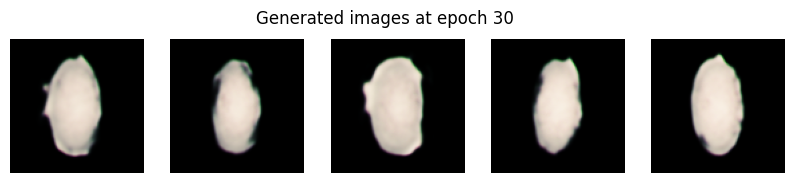

Epoch 31/400 | D loss: 0.9313 | G loss: 3.0914
Epoch 32/400 | D loss: 0.9305 | G loss: 3.0280
Epoch 33/400 | D loss: 0.9295 | G loss: 2.9677
Epoch 34/400 | D loss: 0.9283 | G loss: 2.9109
Epoch 35/400 | D loss: 0.9266 | G loss: 2.8574
Epoch 36/400 | D loss: 0.9251 | G loss: 2.8067
Epoch 37/400 | D loss: 0.9238 | G loss: 2.7586
Epoch 38/400 | D loss: 0.9227 | G loss: 2.7124
Epoch 39/400 | D loss: 0.9216 | G loss: 2.6686
Epoch 40/400 | D loss: 0.9208 | G loss: 2.6265
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


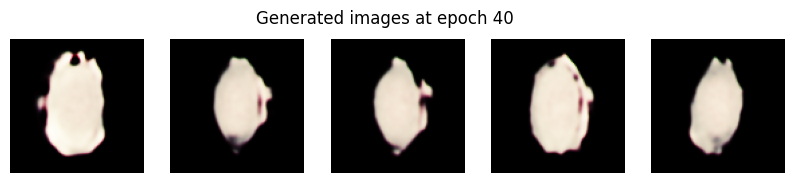

Epoch 41/400 | D loss: 0.9195 | G loss: 2.5865
Epoch 42/400 | D loss: 0.9177 | G loss: 2.5488
Epoch 43/400 | D loss: 0.9155 | G loss: 2.5131
Epoch 44/400 | D loss: 0.9137 | G loss: 2.4785
Epoch 45/400 | D loss: 0.9123 | G loss: 2.4448
Epoch 46/400 | D loss: 0.9109 | G loss: 2.4120
Epoch 47/400 | D loss: 0.9091 | G loss: 2.3806
Epoch 48/400 | D loss: 0.9071 | G loss: 2.3513
Epoch 49/400 | D loss: 0.9051 | G loss: 2.3230
Epoch 50/400 | D loss: 0.9031 | G loss: 2.2953
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


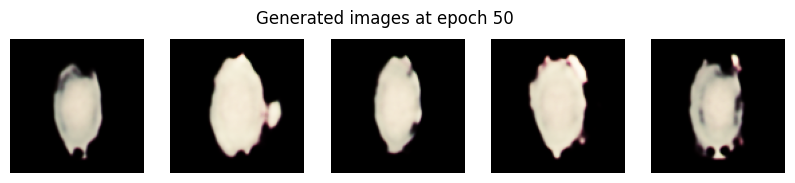

Epoch 51/400 | D loss: 0.9014 | G loss: 2.2689
Epoch 52/400 | D loss: 0.8999 | G loss: 2.2435
Epoch 53/400 | D loss: 0.8980 | G loss: 2.2185
Epoch 54/400 | D loss: 0.8964 | G loss: 2.1947
Epoch 55/400 | D loss: 0.8948 | G loss: 2.1718
Epoch 56/400 | D loss: 0.8931 | G loss: 2.1492
Epoch 57/400 | D loss: 0.8915 | G loss: 2.1273
Epoch 58/400 | D loss: 0.8901 | G loss: 2.1062
Epoch 59/400 | D loss: 0.8888 | G loss: 2.0854
Epoch 60/400 | D loss: 0.8874 | G loss: 2.0653
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


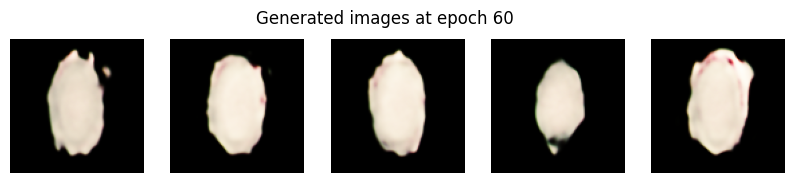

Epoch 61/400 | D loss: 0.8861 | G loss: 2.0460
Epoch 62/400 | D loss: 0.8847 | G loss: 2.0271
Epoch 63/400 | D loss: 0.8833 | G loss: 2.0090
Epoch 64/400 | D loss: 0.8819 | G loss: 1.9914
Epoch 65/400 | D loss: 0.8806 | G loss: 1.9743
Epoch 66/400 | D loss: 0.8794 | G loss: 1.9577
Epoch 67/400 | D loss: 0.8780 | G loss: 1.9413
Epoch 68/400 | D loss: 0.8766 | G loss: 1.9257
Epoch 69/400 | D loss: 0.8750 | G loss: 1.9104
Epoch 70/400 | D loss: 0.8735 | G loss: 1.8956
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


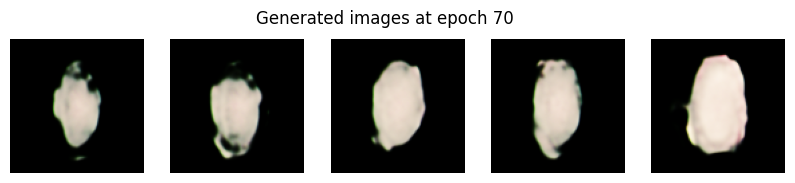

Epoch 71/400 | D loss: 0.8718 | G loss: 1.8811
Epoch 72/400 | D loss: 0.8702 | G loss: 1.8670
Epoch 73/400 | D loss: 0.8685 | G loss: 1.8534
Epoch 74/400 | D loss: 0.8667 | G loss: 1.8401
Epoch 75/400 | D loss: 0.8649 | G loss: 1.8272
Epoch 76/400 | D loss: 0.8633 | G loss: 1.8147
Epoch 77/400 | D loss: 0.8618 | G loss: 1.8025
Epoch 78/400 | D loss: 0.8604 | G loss: 1.7904
Epoch 79/400 | D loss: 0.8591 | G loss: 1.7785
Epoch 80/400 | D loss: 0.8577 | G loss: 1.7670
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


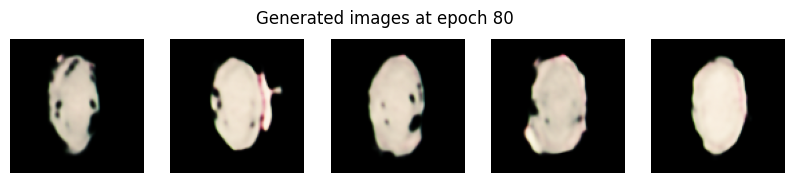

Epoch 81/400 | D loss: 0.8563 | G loss: 1.7558
Epoch 82/400 | D loss: 0.8550 | G loss: 1.7449
Epoch 83/400 | D loss: 0.8537 | G loss: 1.7341
Epoch 84/400 | D loss: 0.8524 | G loss: 1.7237
Epoch 85/400 | D loss: 0.8511 | G loss: 1.7136
Epoch 86/400 | D loss: 0.8497 | G loss: 1.7037
Epoch 87/400 | D loss: 0.8483 | G loss: 1.6941
Epoch 88/400 | D loss: 0.8469 | G loss: 1.6848
Epoch 89/400 | D loss: 0.8455 | G loss: 1.6756
Epoch 90/400 | D loss: 0.8441 | G loss: 1.6666
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


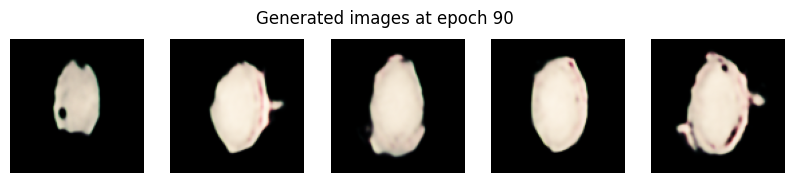

Epoch 91/400 | D loss: 0.8428 | G loss: 1.6578
Epoch 92/400 | D loss: 0.8416 | G loss: 1.6491
Epoch 93/400 | D loss: 0.8403 | G loss: 1.6406
Epoch 94/400 | D loss: 0.8392 | G loss: 1.6323
Epoch 95/400 | D loss: 0.8380 | G loss: 1.6240
Epoch 96/400 | D loss: 0.8369 | G loss: 1.6159
Epoch 97/400 | D loss: 0.8357 | G loss: 1.6079
Epoch 98/400 | D loss: 0.8345 | G loss: 1.6000
Epoch 99/400 | D loss: 0.8334 | G loss: 1.5922
Epoch 100/400 | D loss: 0.8323 | G loss: 1.5847
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


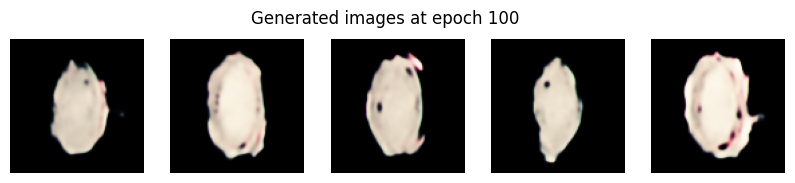

Epoch 101/400 | D loss: 0.8311 | G loss: 1.5773
Epoch 102/400 | D loss: 0.8300 | G loss: 1.5700
Epoch 103/400 | D loss: 0.8289 | G loss: 1.5629
Epoch 104/400 | D loss: 0.8278 | G loss: 1.5560
Epoch 105/400 | D loss: 0.8267 | G loss: 1.5492
Epoch 106/400 | D loss: 0.8256 | G loss: 1.5425
Epoch 107/400 | D loss: 0.8244 | G loss: 1.5360
Epoch 108/400 | D loss: 0.8233 | G loss: 1.5296
Epoch 109/400 | D loss: 0.8222 | G loss: 1.5234
Epoch 110/400 | D loss: 0.8211 | G loss: 1.5172
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


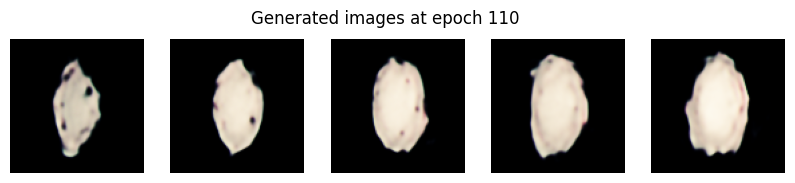

Epoch 111/400 | D loss: 0.8199 | G loss: 1.5112
Epoch 112/400 | D loss: 0.8188 | G loss: 1.5055
Epoch 113/400 | D loss: 0.8177 | G loss: 1.4999
Epoch 114/400 | D loss: 0.8167 | G loss: 1.4942
Epoch 115/400 | D loss: 0.8157 | G loss: 1.4888
Epoch 116/400 | D loss: 0.8147 | G loss: 1.4833
Epoch 117/400 | D loss: 0.8138 | G loss: 1.4779
Epoch 118/400 | D loss: 0.8128 | G loss: 1.4727
Epoch 119/400 | D loss: 0.8119 | G loss: 1.4676
Epoch 120/400 | D loss: 0.8110 | G loss: 1.4624
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


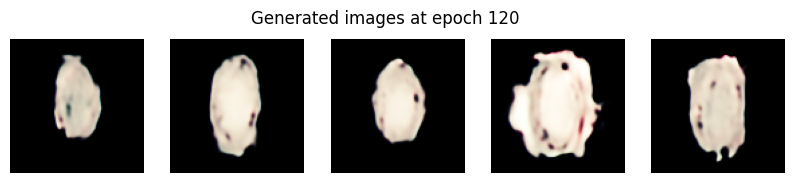

Epoch 121/400 | D loss: 0.8100 | G loss: 1.4574
Epoch 122/400 | D loss: 0.8091 | G loss: 1.4525
Epoch 123/400 | D loss: 0.8082 | G loss: 1.4476
Epoch 124/400 | D loss: 0.8073 | G loss: 1.4428
Epoch 125/400 | D loss: 0.8063 | G loss: 1.4380
Epoch 126/400 | D loss: 0.8054 | G loss: 1.4332
Epoch 127/400 | D loss: 0.8045 | G loss: 1.4286
Epoch 128/400 | D loss: 0.8036 | G loss: 1.4241
Epoch 129/400 | D loss: 0.8027 | G loss: 1.4196
Epoch 130/400 | D loss: 0.8018 | G loss: 1.4152
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


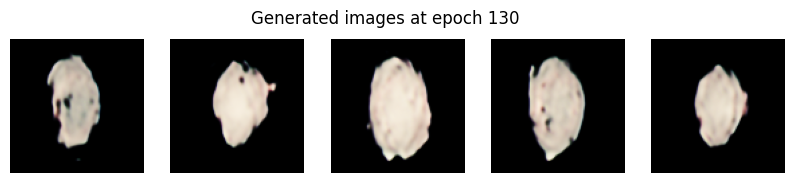

Epoch 131/400 | D loss: 0.8009 | G loss: 1.4108
Epoch 132/400 | D loss: 0.8001 | G loss: 1.4065
Epoch 133/400 | D loss: 0.7992 | G loss: 1.4024
Epoch 134/400 | D loss: 0.7983 | G loss: 1.3982
Epoch 135/400 | D loss: 0.7975 | G loss: 1.3942
Epoch 136/400 | D loss: 0.7967 | G loss: 1.3903
Epoch 137/400 | D loss: 0.7960 | G loss: 1.3863
Epoch 138/400 | D loss: 0.7953 | G loss: 1.3825
Epoch 139/400 | D loss: 0.7945 | G loss: 1.3786
Epoch 140/400 | D loss: 0.7938 | G loss: 1.3748
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


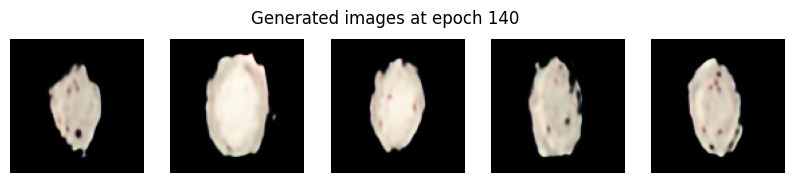

Epoch 141/400 | D loss: 0.7931 | G loss: 1.3709
Epoch 142/400 | D loss: 0.7924 | G loss: 1.3672
Epoch 143/400 | D loss: 0.7917 | G loss: 1.3637
Epoch 144/400 | D loss: 0.7910 | G loss: 1.3601
Epoch 145/400 | D loss: 0.7903 | G loss: 1.3566
Epoch 146/400 | D loss: 0.7897 | G loss: 1.3530
Epoch 147/400 | D loss: 0.7890 | G loss: 1.3494
Epoch 148/400 | D loss: 0.7884 | G loss: 1.3459
Epoch 149/400 | D loss: 0.7878 | G loss: 1.3425
Epoch 150/400 | D loss: 0.7871 | G loss: 1.3391
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


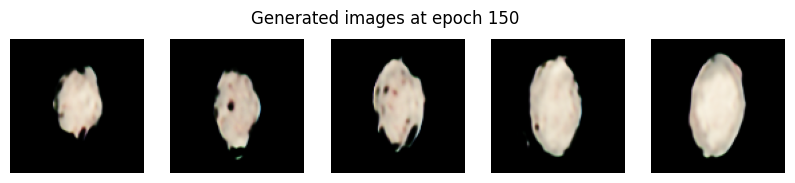

Epoch 151/400 | D loss: 0.7866 | G loss: 1.3357
Epoch 152/400 | D loss: 0.7860 | G loss: 1.3322
Epoch 153/400 | D loss: 0.7854 | G loss: 1.3289
Epoch 154/400 | D loss: 0.7849 | G loss: 1.3256
Epoch 155/400 | D loss: 0.7844 | G loss: 1.3225
Epoch 156/400 | D loss: 0.7838 | G loss: 1.3195
Epoch 157/400 | D loss: 0.7833 | G loss: 1.3162
Epoch 158/400 | D loss: 0.7827 | G loss: 1.3131
Epoch 159/400 | D loss: 0.7821 | G loss: 1.3100
Epoch 160/400 | D loss: 0.7817 | G loss: 1.3069
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


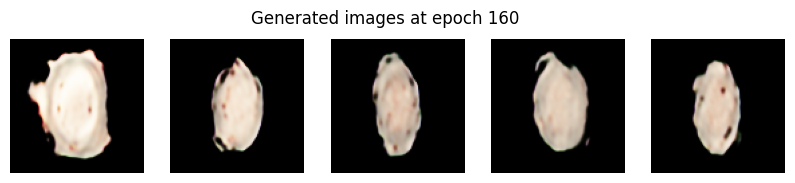

Epoch 161/400 | D loss: 0.7813 | G loss: 1.3041
Epoch 162/400 | D loss: 0.7807 | G loss: 1.3013
Epoch 163/400 | D loss: 0.7803 | G loss: 1.2982
Epoch 164/400 | D loss: 0.7798 | G loss: 1.2952
Epoch 165/400 | D loss: 0.7793 | G loss: 1.2923
Epoch 166/400 | D loss: 0.7788 | G loss: 1.2894
Epoch 167/400 | D loss: 0.7783 | G loss: 1.2865
Epoch 168/400 | D loss: 0.7778 | G loss: 1.2837
Epoch 169/400 | D loss: 0.7774 | G loss: 1.2809
Epoch 170/400 | D loss: 0.7769 | G loss: 1.2781
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


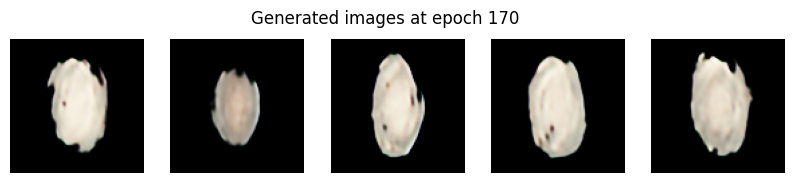

Epoch 171/400 | D loss: 0.7764 | G loss: 1.2753
Epoch 172/400 | D loss: 0.7759 | G loss: 1.2725
Epoch 173/400 | D loss: 0.7755 | G loss: 1.2698
Epoch 174/400 | D loss: 0.7750 | G loss: 1.2672
Epoch 175/400 | D loss: 0.7745 | G loss: 1.2645
Epoch 176/400 | D loss: 0.7741 | G loss: 1.2619
Epoch 219/400 | D loss: 0.7597 | G loss: 1.1670
Epoch 220/400 | D loss: 0.7594 | G loss: 1.1651
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


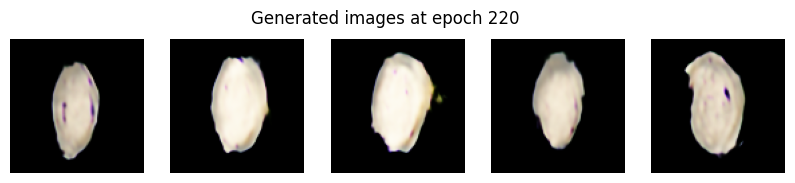

Epoch 221/400 | D loss: 0.7591 | G loss: 1.1633
Epoch 222/400 | D loss: 0.7589 | G loss: 1.1615
Epoch 223/400 | D loss: 0.7586 | G loss: 1.1597
Epoch 224/400 | D loss: 0.7583 | G loss: 1.1579
Epoch 225/400 | D loss: 0.7580 | G loss: 1.1561
Epoch 226/400 | D loss: 0.7578 | G loss: 1.1544
Epoch 227/400 | D loss: 0.7575 | G loss: 1.1527
Epoch 228/400 | D loss: 0.7572 | G loss: 1.1509
Epoch 229/400 | D loss: 0.7569 | G loss: 1.1492
Epoch 230/400 | D loss: 0.7567 | G loss: 1.1476
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


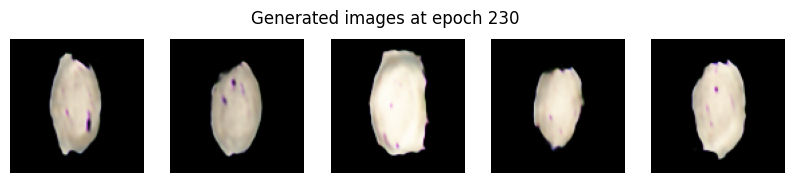

Epoch 231/400 | D loss: 0.7564 | G loss: 1.1459
Epoch 232/400 | D loss: 0.7561 | G loss: 1.1443
Epoch 233/400 | D loss: 0.7559 | G loss: 1.1426
Epoch 234/400 | D loss: 0.7556 | G loss: 1.1409
Epoch 235/400 | D loss: 0.7554 | G loss: 1.1393
Epoch 236/400 | D loss: 0.7551 | G loss: 1.1377
Epoch 237/400 | D loss: 0.7549 | G loss: 1.1361
Epoch 238/400 | D loss: 0.7546 | G loss: 1.1346
Epoch 239/400 | D loss: 0.7543 | G loss: 1.1330
Epoch 240/400 | D loss: 0.7541 | G loss: 1.1314
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


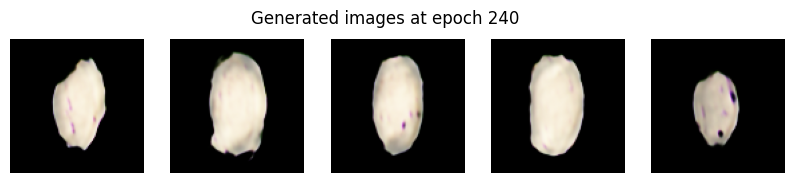

Epoch 241/400 | D loss: 0.7538 | G loss: 1.1299
Epoch 242/400 | D loss: 0.7536 | G loss: 1.1283
Epoch 243/400 | D loss: 0.7533 | G loss: 1.1268
Epoch 244/400 | D loss: 0.7531 | G loss: 1.1253
Epoch 245/400 | D loss: 0.7528 | G loss: 1.1238
Epoch 246/400 | D loss: 0.7526 | G loss: 1.1223
Epoch 247/400 | D loss: 0.7523 | G loss: 1.1208
Epoch 248/400 | D loss: 0.7521 | G loss: 1.1194
Epoch 249/400 | D loss: 0.7518 | G loss: 1.1180
Epoch 250/400 | D loss: 0.7516 | G loss: 1.1165
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


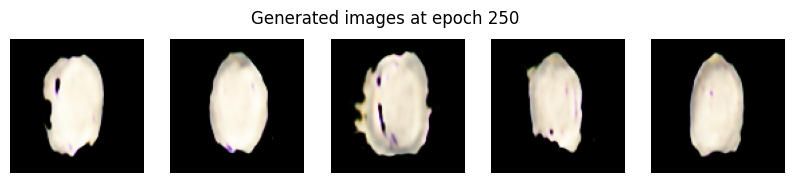

Epoch 251/400 | D loss: 0.7513 | G loss: 1.1151
Epoch 252/400 | D loss: 0.7511 | G loss: 1.1137
Epoch 253/400 | D loss: 0.7509 | G loss: 1.1123
Epoch 254/400 | D loss: 0.7506 | G loss: 1.1109
Epoch 255/400 | D loss: 0.7504 | G loss: 1.1096
Epoch 256/400 | D loss: 0.7501 | G loss: 1.1082
Epoch 257/400 | D loss: 0.7499 | G loss: 1.1069
Epoch 258/400 | D loss: 0.7497 | G loss: 1.1055
Epoch 259/400 | D loss: 0.7494 | G loss: 1.1042
Epoch 260/400 | D loss: 0.7492 | G loss: 1.1029
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


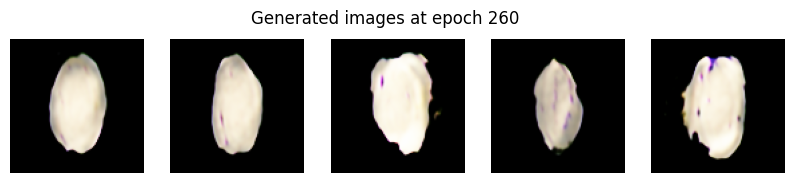

Epoch 261/400 | D loss: 0.7489 | G loss: 1.1016
Epoch 262/400 | D loss: 0.7487 | G loss: 1.1003
Epoch 263/400 | D loss: 0.7485 | G loss: 1.0990
Epoch 264/400 | D loss: 0.7482 | G loss: 1.0977
Epoch 265/400 | D loss: 0.7480 | G loss: 1.0965
Epoch 266/400 | D loss: 0.7477 | G loss: 1.0952
Epoch 267/400 | D loss: 0.7475 | G loss: 1.0940
Epoch 268/400 | D loss: 0.7473 | G loss: 1.0928
Epoch 269/400 | D loss: 0.7470 | G loss: 1.0916
Epoch 270/400 | D loss: 0.7468 | G loss: 1.0904
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


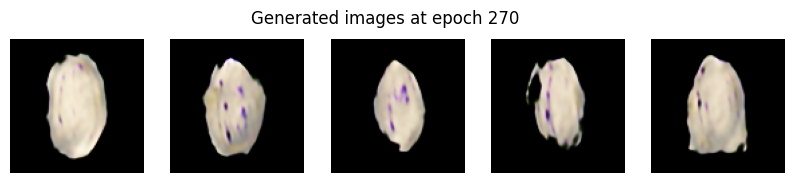

Epoch 271/400 | D loss: 0.7465 | G loss: 1.0891
Epoch 272/400 | D loss: 0.7463 | G loss: 1.0880
Epoch 273/400 | D loss: 0.7461 | G loss: 1.0868
Epoch 274/400 | D loss: 0.7458 | G loss: 1.0857
Epoch 275/400 | D loss: 0.7456 | G loss: 1.0845
Epoch 276/400 | D loss: 0.7454 | G loss: 1.0833
Epoch 277/400 | D loss: 0.7452 | G loss: 1.0822
Epoch 278/400 | D loss: 0.7449 | G loss: 1.0811
Epoch 279/400 | D loss: 0.7447 | G loss: 1.0799
Epoch 280/400 | D loss: 0.7445 | G loss: 1.0788
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


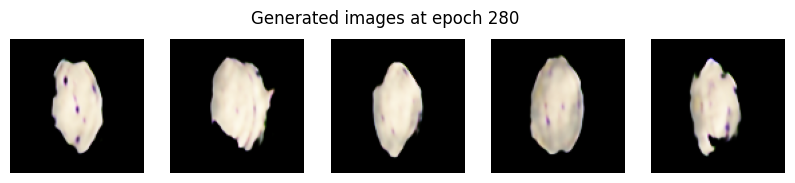

Epoch 281/400 | D loss: 0.7442 | G loss: 1.0777
Epoch 282/400 | D loss: 0.7440 | G loss: 1.0766
Epoch 283/400 | D loss: 0.7437 | G loss: 1.0755
Epoch 284/400 | D loss: 0.7435 | G loss: 1.0745
Epoch 285/400 | D loss: 0.7433 | G loss: 1.0734
Epoch 286/400 | D loss: 0.7431 | G loss: 1.0723
Epoch 287/400 | D loss: 0.7428 | G loss: 1.0713
Epoch 288/400 | D loss: 0.7426 | G loss: 1.0703
Epoch 289/400 | D loss: 0.7424 | G loss: 1.0693
Epoch 290/400 | D loss: 0.7421 | G loss: 1.0682
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


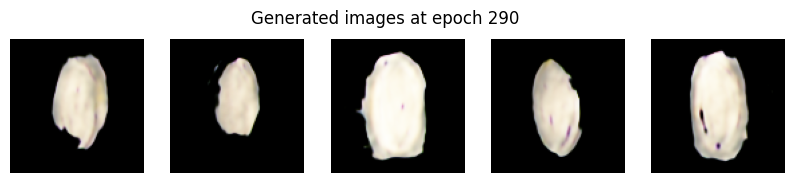

Epoch 291/400 | D loss: 0.7419 | G loss: 1.0672
Epoch 292/400 | D loss: 0.7417 | G loss: 1.0662
Epoch 293/400 | D loss: 0.7414 | G loss: 1.0652
Epoch 294/400 | D loss: 0.7413 | G loss: 1.0643
Epoch 295/400 | D loss: 0.7410 | G loss: 1.0633
Epoch 296/400 | D loss: 0.7408 | G loss: 1.0623
Epoch 297/400 | D loss: 0.7406 | G loss: 1.0615
Epoch 298/400 | D loss: 0.7404 | G loss: 1.0605
Epoch 299/400 | D loss: 0.7402 | G loss: 1.0596
Epoch 300/400 | D loss: 0.7399 | G loss: 1.0586
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


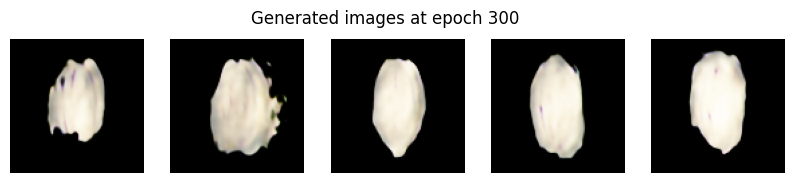

Epoch 301/400 | D loss: 0.7398 | G loss: 1.0576
Epoch 302/400 | D loss: 0.7396 | G loss: 1.0568
Epoch 303/400 | D loss: 0.7394 | G loss: 1.0559
Epoch 304/400 | D loss: 0.7392 | G loss: 1.0549
Epoch 305/400 | D loss: 0.7390 | G loss: 1.0540
Epoch 306/400 | D loss: 0.7388 | G loss: 1.0530
Epoch 307/400 | D loss: 0.7386 | G loss: 1.0521
Epoch 308/400 | D loss: 0.7384 | G loss: 1.0512
Epoch 309/400 | D loss: 0.7382 | G loss: 1.0504
Epoch 310/400 | D loss: 0.7380 | G loss: 1.0494
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


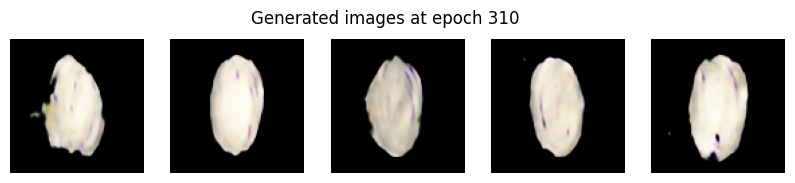

Epoch 311/400 | D loss: 0.7378 | G loss: 1.0485
Epoch 312/400 | D loss: 0.7376 | G loss: 1.0476
Epoch 313/400 | D loss: 0.7375 | G loss: 1.0468
Epoch 314/400 | D loss: 0.7372 | G loss: 1.0460
Epoch 315/400 | D loss: 0.7371 | G loss: 1.0451
Epoch 316/400 | D loss: 0.7369 | G loss: 1.0442
Epoch 317/400 | D loss: 0.7367 | G loss: 1.0434
Epoch 318/400 | D loss: 0.7365 | G loss: 1.0426
Epoch 319/400 | D loss: 0.7363 | G loss: 1.0418
Epoch 320/400 | D loss: 0.7362 | G loss: 1.0410
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


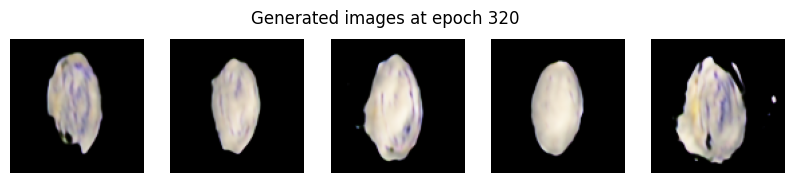

Epoch 321/400 | D loss: 0.7359 | G loss: 1.0401
Epoch 322/400 | D loss: 0.7358 | G loss: 1.0393
Epoch 323/400 | D loss: 0.7356 | G loss: 1.0386
Epoch 324/400 | D loss: 0.7354 | G loss: 1.0378
Epoch 325/400 | D loss: 0.7353 | G loss: 1.0371
Epoch 326/400 | D loss: 0.7350 | G loss: 1.0363
Epoch 327/400 | D loss: 0.7349 | G loss: 1.0355
Epoch 328/400 | D loss: 0.7347 | G loss: 1.0349
Epoch 329/400 | D loss: 0.7345 | G loss: 1.0341
Epoch 330/400 | D loss: 0.7344 | G loss: 1.0334
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


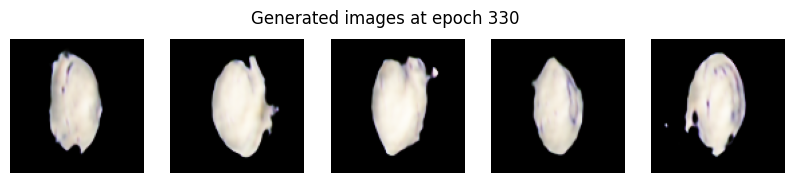

Epoch 331/400 | D loss: 0.7342 | G loss: 1.0327
Epoch 332/400 | D loss: 0.7340 | G loss: 1.0319
Epoch 333/400 | D loss: 0.7339 | G loss: 1.0312
Epoch 334/400 | D loss: 0.7336 | G loss: 1.0306
Epoch 335/400 | D loss: 0.7336 | G loss: 1.0297
Epoch 336/400 | D loss: 0.7334 | G loss: 1.0291
Epoch 337/400 | D loss: 0.7332 | G loss: 1.0284
Epoch 338/400 | D loss: 0.7331 | G loss: 1.0276
Epoch 339/400 | D loss: 0.7329 | G loss: 1.0269
Epoch 340/400 | D loss: 0.7327 | G loss: 1.0262
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


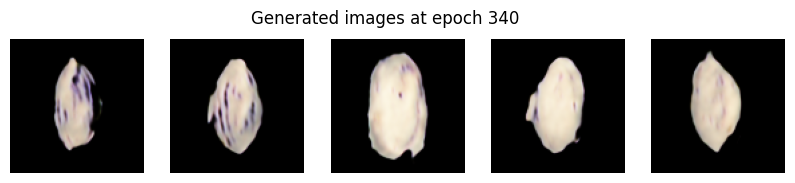

Epoch 341/400 | D loss: 0.7326 | G loss: 1.0255
Epoch 342/400 | D loss: 0.7324 | G loss: 1.0248
Epoch 343/400 | D loss: 0.7322 | G loss: 1.0241
Epoch 344/400 | D loss: 0.7321 | G loss: 1.0233
Epoch 345/400 | D loss: 0.7319 | G loss: 1.0227
Epoch 346/400 | D loss: 0.7317 | G loss: 1.0220
Epoch 347/400 | D loss: 0.7316 | G loss: 1.0214
Epoch 348/400 | D loss: 0.7314 | G loss: 1.0207
Epoch 349/400 | D loss: 0.7313 | G loss: 1.0200
Epoch 350/400 | D loss: 0.7311 | G loss: 1.0194
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


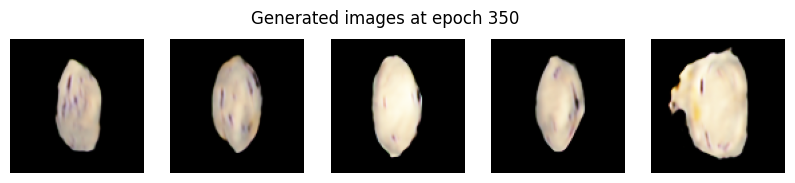

Epoch 351/400 | D loss: 0.7309 | G loss: 1.0187
Epoch 352/400 | D loss: 0.7308 | G loss: 1.0181
Epoch 353/400 | D loss: 0.7306 | G loss: 1.0175
Epoch 354/400 | D loss: 0.7305 | G loss: 1.0168
Epoch 355/400 | D loss: 0.7304 | G loss: 1.0162
Epoch 356/400 | D loss: 0.7301 | G loss: 1.0155
Epoch 357/400 | D loss: 0.7301 | G loss: 1.0149
Epoch 358/400 | D loss: 0.7300 | G loss: 1.0143
Epoch 359/400 | D loss: 0.7297 | G loss: 1.0137
Epoch 360/400 | D loss: 0.7297 | G loss: 1.0129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


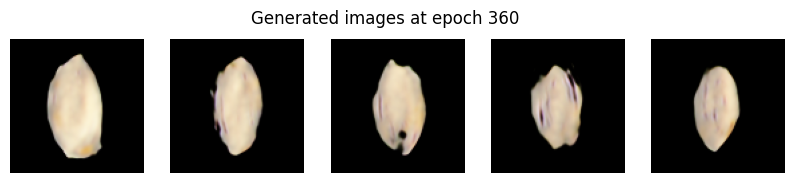

Epoch 361/400 | D loss: 0.7295 | G loss: 1.0124
Epoch 362/400 | D loss: 0.7293 | G loss: 1.0118
Epoch 363/400 | D loss: 0.7293 | G loss: 1.0111
Epoch 364/400 | D loss: 0.7291 | G loss: 1.0105
Epoch 365/400 | D loss: 0.7289 | G loss: 1.0098
Epoch 366/400 | D loss: 0.7289 | G loss: 1.0091
Epoch 367/400 | D loss: 0.7287 | G loss: 1.0086
Epoch 368/400 | D loss: 0.7286 | G loss: 1.0079
Epoch 369/400 | D loss: 0.7285 | G loss: 1.0073
Epoch 370/400 | D loss: 0.7283 | G loss: 1.0067
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


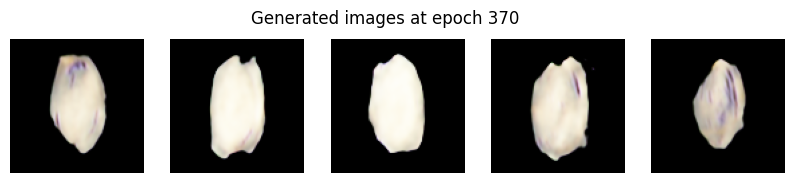

Epoch 371/400 | D loss: 0.7282 | G loss: 1.0060
Epoch 372/400 | D loss: 0.7281 | G loss: 1.0054
Epoch 373/400 | D loss: 0.7279 | G loss: 1.0049
Epoch 374/400 | D loss: 0.7278 | G loss: 1.0042
Epoch 375/400 | D loss: 0.7277 | G loss: 1.0036
Epoch 376/400 | D loss: 0.7275 | G loss: 1.0030
Epoch 377/400 | D loss: 0.7274 | G loss: 1.0023
Epoch 378/400 | D loss: 0.7273 | G loss: 1.0018
Epoch 379/400 | D loss: 0.7271 | G loss: 1.0012
Epoch 380/400 | D loss: 0.7271 | G loss: 1.0005
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


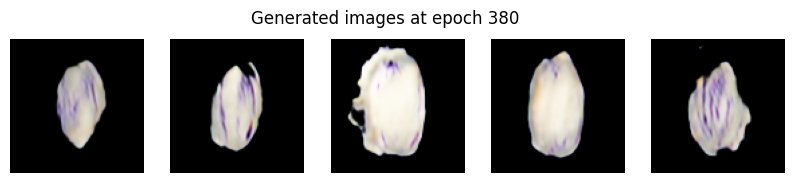

Epoch 381/400 | D loss: 0.7269 | G loss: 1.0000
Epoch 382/400 | D loss: 0.7267 | G loss: 0.9994
Epoch 383/400 | D loss: 0.7267 | G loss: 0.9988
Epoch 384/400 | D loss: 0.7265 | G loss: 0.9984
Epoch 385/400 | D loss: 0.7264 | G loss: 0.9977
Epoch 386/400 | D loss: 0.7264 | G loss: 0.9971
Epoch 387/400 | D loss: 0.7262 | G loss: 0.9965
Epoch 388/400 | D loss: 0.7261 | G loss: 0.9959
Epoch 389/400 | D loss: 0.7260 | G loss: 0.9953
Epoch 390/400 | D loss: 0.7258 | G loss: 0.9948
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


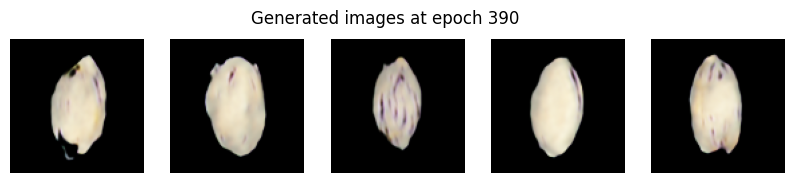

Epoch 391/400 | D loss: 0.7257 | G loss: 0.9942
Epoch 392/400 | D loss: 0.7256 | G loss: 0.9936
Epoch 393/400 | D loss: 0.7254 | G loss: 0.9930
Epoch 394/400 | D loss: 0.7254 | G loss: 0.9924
Epoch 395/400 | D loss: 0.7253 | G loss: 0.9920
Epoch 396/400 | D loss: 0.7251 | G loss: 0.9915
Epoch 397/400 | D loss: 0.7250 | G loss: 0.9909
Epoch 398/400 | D loss: 0.7249 | G loss: 0.9904
Epoch 399/400 | D loss: 0.7247 | G loss: 0.9899
Epoch 400/400 | D loss: 0.7247 | G loss: 0.9893
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


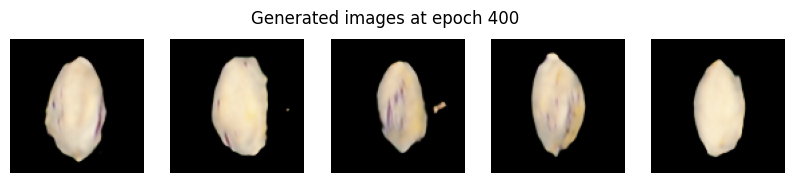

In [33]:
epochs = 400
losses_d2 = []
losses_g2 = []

for epoch in range(epochs):
    for real_imgs in train_ds:
        noise = get_random_noise(batch_size, noise_dim)
        fake_imgs = generator_network2(noise, training=True)

        real_labels = np.ones((real_imgs.shape[0], 1))
        fake_labels = np.zeros((fake_imgs.shape[0], 1))

        discriminator_network2.trainable = True
        d_loss_real = discriminator_network2.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator_network2.train_on_batch(fake_imgs, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        noise = get_random_noise(batch_size, noise_dim)
        misleading_labels = np.ones((batch_size, 1))

        discriminator_network2.trainable = False
        g_loss = gan_model2.train_on_batch(noise, misleading_labels)

    losses_d2.append(d_loss[0])
    losses_g2.append(g_loss)

    print(f"Epoch {epoch+1}/{epochs} | D loss: {d_loss[0]:.4f} | G loss: {g_loss:.4f}")

    if (epoch + 1) % 10 == 0:
        show_generator_results(generator_network2, epoch + 1)

In [37]:
history_dict = {
    "d_loss": [float(v) for v in losses_d2],
    "g_loss": [float(v) for v in losses_g2]
}

with open("modif_history.json", "w") as f:
    json.dump(history_dict, f)

In [38]:
generator_network2.save('generator_modif.keras')
discriminator_network2.save('discriminator_modif.keras')

In [39]:
generator = load_model('generator_baseline.keras')
generator2 = load_model('generator_modif.keras')
real_images = x_train

In [40]:
n_fid = 1000
real_images = real_images[:n_fid]

noise = tf.random.normal([n_fid, 100])
fake_images = generator.predict(noise, verbose=0)
fake_images2 = generator2.predict(noise, verbose = 0)

In [41]:
def preprocess_for_fid(images):
    images_resized = np.array([resize(img, (299, 299), anti_aliasing=True) for img in images])
    images_resized = (images_resized + 1) / 2  # dari [-1,1] → [0,1]
    images_preprocessed = preprocess_input(images_resized * 255)  # untuk Inception
    return images_preprocessed

In [42]:
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

In [43]:
def calculate_fid_score(real_images, fake_images):
    real_proc = preprocess_for_fid(real_images)
    fake_proc = preprocess_for_fid(fake_images)

    act1 = inception_model.predict(real_proc, verbose=0)
    act2 = inception_model.predict(fake_proc, verbose=0)

    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)

    diff = mu1 - mu2
    covmean, _ = sqrtm(sigma1.dot(sigma2), disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = np.sum(diff**2) + np.trace(sigma1 + sigma2 - 2 * covmean)
    return fid

In [44]:
def show_comparison(real_images, fake_images, title, n=5):
    fid_score = calculate_fid_score(real_images, fake_images)

    plt.figure(figsize=(12, 4))
    for i in range(n):
        # Real
        plt.subplot(2, n, i+1)
        plt.imshow(((real_images[i] + 1) / 2).clip(0, 1))
        plt.axis('off')
        if i == 0: plt.ylabel('Real', fontsize=12)

        # Fake
        plt.subplot(2, n, i+n+1)
        plt.imshow(((fake_images[i] + 1) / 2).clip(0, 1))
        plt.axis('off')
        if i == 0: plt.ylabel('Fake', fontsize=12)

    plt.suptitle(f"Real vs Fake Images ({title}) | FID Score: {fid_score:.4f}", fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    return fid_score 

# Baseline VS Modified


In [30]:
print("Baseline")
calculate_fid_score(real_images, fake_images)

Baseline


169.52663921151844

In [45]:
print("modified")
calculate_fid_score(real_images, fake_images2)

modified


147.40491579375072

Hasil evaluasi menggunakan metrik Fréchet Inception Distance (FID) menunjukkan bahwa model hasil modifikasi memiliki skor FID sebesar 147.40, lebih rendah dibandingkan dengan model baseline yang memiliki skor 164.05. Nilai FID yang lebih rendah menandakan bahwa distribusi fitur dari gambar yang dihasilkan oleh generator lebih mendekati distribusi fitur dari gambar asli, sehingga kualitas visual dari gambar buatan tersebut dianggap lebih baik. Dengan kata lain, modifikasi arsitektur yang melibatkan penambahan dropout dan penyesuaian learning rate memberikan dampak positif terhadap performa model dalam menghasilkan gambar yang lebih realistis dan menyerupai data asli. Meskipun perbedaannya tidak terlalu besar, penurunan skor FID ini tetap mengindikasikan adanya peningkatan dalam kemampuan generatif model, oleh karena itu kita akan melakukan tuning terhadap modified model


# Hyperparameter Tuning Modified Model


In [13]:
def generator_tuning(dropout_rate=0.3):
    random_input = layers.Input(shape=(noise_dim,))
    x = layers.Dense(106 * 106 * 64, activation='relu')(random_input)
    x = layers.Reshape((106, 106, 64))(x)
    x = layers.Conv2D(16, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Dropout(dropout_rate)(x)
    x = layers.Conv2D(32, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Dropout(dropout_rate)(x)
    x = layers.Conv2D(64, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Conv2D(3, (3, 3), strides=1, padding='same', activation='tanh')(x)
    return Model(random_input, x, name="generator")

In [14]:
def discriminator_tuning(dropout_rate=0.3):
    image_input = layers.Input(shape=IMG_SHAPE)
    x = layers.ZeroPadding2D(padding=(3, 3))(image_input)
    x = layers.Conv2D(16, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Dropout(dropout_rate)(x)
    x = layers.Conv2D(32, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Dropout(dropout_rate)(x)
    x = layers.Conv2D(64, (3, 3), strides=1, padding='valid', activation='relu')(x)
    x = layers.Flatten()(x)
    output = layers.Dense(1, activation='sigmoid')(x)
    return Model(image_input, output, name='discriminator')


disini kita akan melakukan tuning untuk nilai drop outnya sebesar 0.2 dan 0.3, lalu untuk learning ratenya sebesar 1e-4 dan 1e-5


In [15]:
dropout_rates = [0.1, 0.2]
learning_rates = [1e-5, 1e-6]

results = []

for dr in dropout_rates:
    for lr in learning_rates:
        print(f"\nTraining with dropout={dr}, lr={lr}")

        generator = generator_tuning(dropout_rate=dr)
        discriminator = discriminator_tuning(dropout_rate=dr)

        discriminator.compile(
            loss='binary_crossentropy',
            optimizer=tf.keras.optimizers.Adam(learning_rate=lr, beta_1=0.5)
        )

        discriminator.trainable = False
        gan_input = layers.Input(shape=(noise_dim,))
        gan_output = discriminator(generator(gan_input))
        gan = Model(gan_input, gan_output)
        gan.compile(
            loss='binary_crossentropy',
            optimizer=tf.keras.optimizers.Adam(learning_rate=lr, beta_1=0.5)
        )

        for epoch in range(50):  
            for real_batch in train_ds:
                if real_batch.shape[0] != batch_size:
                    continue

                noise = get_random_noise(batch_size, noise_dim)
                fake_images = generator.predict(noise, verbose=0)

                real_labels = np.ones((batch_size, 1))
                fake_labels = np.zeros((batch_size, 1))

                discriminator.trainable = True
                discriminator.train_on_batch(real_batch, real_labels)
                discriminator.train_on_batch(fake_images, fake_labels)

                noise = get_random_noise(batch_size, noise_dim)
                misleading_labels = np.ones((batch_size, 1))

                discriminator.trainable = False
                gan.train_on_batch(noise, misleading_labels)

        real_imgs3 = next(iter(train_ds.take(1)))[:10] 
        noise3 = get_random_noise(10, noise_dim)
        fake_imgs3 = generator.predict(noise3)

        real_imgs3 = real_imgs3.numpy() if tf.is_tensor(real_imgs3) else real_imgs3
        fake_imgs3 = fake_imgs3.numpy() if tf.is_tensor(fake_imgs3) else fake_imgs3

        fid_score = calculate_fid_score(real_imgs3, fake_imgs3)
        print(f"FID Score: {fid_score:.4f}")

        results.append({
            'dropout': dr,
            'learning_rate': lr,
            'fid': float(fid_score)  
        })

best_result = sorted(results, key=lambda x: x['fid'])[0]
print("\nBest configuration:")
print(f"Dropout: {best_result['dropout']}, LR: {best_result['learning_rate']}, FID: {best_result['fid']:.4f}")


Training with dropout=0.1, lr=1e-05
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step
FID Score: 450.5137

Training with dropout=0.1, lr=1e-06
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
FID Score: 563.0090

Training with dropout=0.2, lr=1e-05
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
FID Score: 465.9640

Training with dropout=0.2, lr=1e-06
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
FID Score: 551.9771

Best configuration:
Dropout: 0.1, LR: 1e-05, FID: 450.5137


Dari hasil hyperparameter tuning dengan 50 epoch didapat hasil bahwa FID terkecil adalah dengan Dropout 0.2 dan learning rate 1e-4, oleh karena itu akan kita tuning kembali dengan ke 2 value tersebut


Epoch 1/400 | D loss: 0.4928 | G loss: 0.6884
Epoch 2/400 | D loss: 0.4295 | G loss: 0.6865
Epoch 3/400 | D loss: 0.4058 | G loss: 0.6854
Epoch 4/400 | D loss: 0.3934 | G loss: 0.6845
Epoch 5/400 | D loss: 0.3857 | G loss: 0.6841
Epoch 6/400 | D loss: 0.3803 | G loss: 0.6840
Epoch 7/400 | D loss: 0.3762 | G loss: 0.6844
Epoch 8/400 | D loss: 0.3727 | G loss: 0.6857
Epoch 9/400 | D loss: 0.3694 | G loss: 0.6880
Epoch 10/400 | D loss: 0.3658 | G loss: 0.6918
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


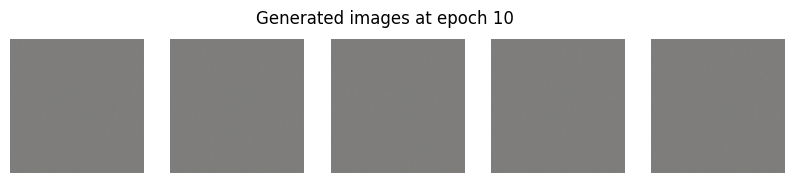

Epoch 11/400 | D loss: 0.3618 | G loss: 0.6976
Epoch 12/400 | D loss: 0.3570 | G loss: 0.7062
Epoch 13/400 | D loss: 0.3513 | G loss: 0.7182
Epoch 14/400 | D loss: 0.3444 | G loss: 0.7345
Epoch 15/400 | D loss: 0.3364 | G loss: 0.7560
Epoch 16/400 | D loss: 0.3274 | G loss: 0.7835
Epoch 17/400 | D loss: 0.3177 | G loss: 0.8168
Epoch 18/400 | D loss: 0.3077 | G loss: 0.8551
Epoch 19/400 | D loss: 0.2976 | G loss: 0.8978
Epoch 20/400 | D loss: 0.2876 | G loss: 0.9441
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


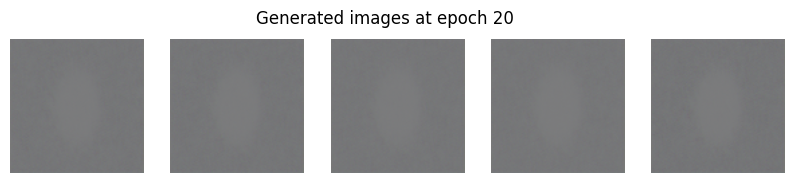

Epoch 21/400 | D loss: 0.2778 | G loss: 0.9939
Epoch 22/400 | D loss: 0.2684 | G loss: 1.0471
Epoch 23/400 | D loss: 0.2593 | G loss: 1.1034
Epoch 24/400 | D loss: 0.2505 | G loss: 1.1624
Epoch 25/400 | D loss: 0.2422 | G loss: 1.2239
Epoch 26/400 | D loss: 0.2342 | G loss: 1.2872
Epoch 27/400 | D loss: 0.2267 | G loss: 1.3523
Epoch 28/400 | D loss: 0.2195 | G loss: 1.4182
Epoch 29/400 | D loss: 0.2127 | G loss: 1.4845
Epoch 30/400 | D loss: 0.2063 | G loss: 1.5514
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


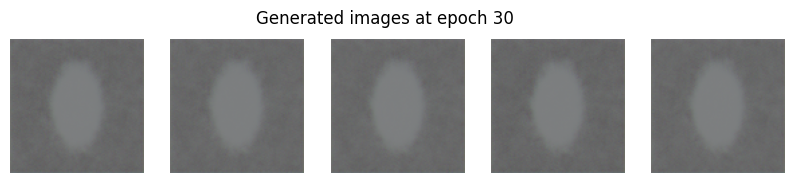

Epoch 31/400 | D loss: 0.2003 | G loss: 1.6170
Epoch 32/400 | D loss: 0.1946 | G loss: 1.6810
Epoch 33/400 | D loss: 0.1892 | G loss: 1.7439
Epoch 34/400 | D loss: 0.1841 | G loss: 1.8050
Epoch 35/400 | D loss: 0.1792 | G loss: 1.8645
Epoch 36/400 | D loss: 0.1746 | G loss: 1.9233
Epoch 37/400 | D loss: 0.1702 | G loss: 1.9796
Epoch 38/400 | D loss: 0.1661 | G loss: 2.0358
Epoch 39/400 | D loss: 0.1621 | G loss: 2.0883
Epoch 40/400 | D loss: 0.1583 | G loss: 2.1409
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


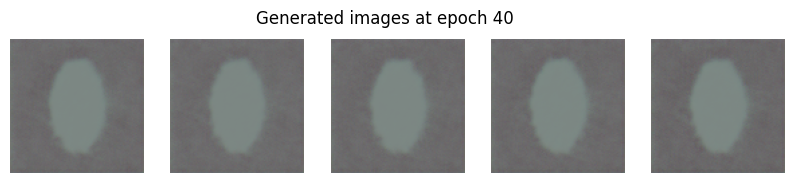

Epoch 41/400 | D loss: 0.1547 | G loss: 2.1922
Epoch 42/400 | D loss: 0.1513 | G loss: 2.2409
Epoch 43/400 | D loss: 0.1480 | G loss: 2.2889
Epoch 44/400 | D loss: 0.1448 | G loss: 2.3358
Epoch 45/400 | D loss: 0.1418 | G loss: 2.3815
Epoch 46/400 | D loss: 0.1389 | G loss: 2.4261
Epoch 47/400 | D loss: 0.1361 | G loss: 2.4708
Epoch 48/400 | D loss: 0.1334 | G loss: 2.5151
Epoch 49/400 | D loss: 0.1308 | G loss: 2.5606
Epoch 50/400 | D loss: 0.1283 | G loss: 2.6060
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


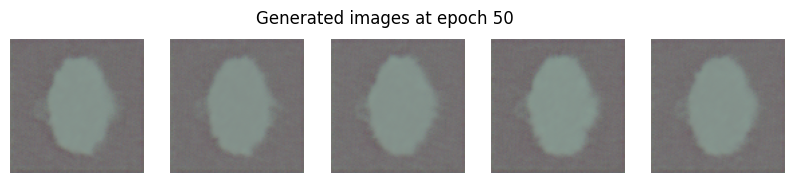

Epoch 51/400 | D loss: 0.1258 | G loss: 2.6517
Epoch 52/400 | D loss: 0.1235 | G loss: 2.6981
Epoch 53/400 | D loss: 0.1212 | G loss: 2.7434
Epoch 54/400 | D loss: 0.1191 | G loss: 2.7875
Epoch 55/400 | D loss: 0.1170 | G loss: 2.8290
Epoch 56/400 | D loss: 0.1150 | G loss: 2.8673
Epoch 57/400 | D loss: 0.1131 | G loss: 2.9014
Epoch 58/400 | D loss: 0.1113 | G loss: 2.9304
Epoch 59/400 | D loss: 0.1096 | G loss: 2.9554
Epoch 60/400 | D loss: 0.1080 | G loss: 2.9782
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


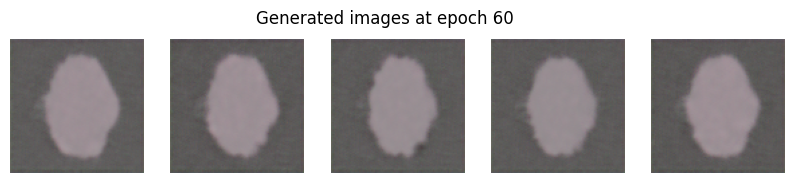

Epoch 61/400 | D loss: 0.1064 | G loss: 3.0009
Epoch 62/400 | D loss: 0.1049 | G loss: 3.0237
Epoch 63/400 | D loss: 0.1034 | G loss: 3.0462
Epoch 64/400 | D loss: 0.1020 | G loss: 3.0681
Epoch 65/400 | D loss: 0.1007 | G loss: 3.0892
Epoch 66/400 | D loss: 0.0994 | G loss: 3.1094
Epoch 67/400 | D loss: 0.0982 | G loss: 3.1292
Epoch 68/400 | D loss: 0.0971 | G loss: 3.1478
Epoch 69/400 | D loss: 0.0960 | G loss: 3.1657
Epoch 70/400 | D loss: 0.0951 | G loss: 3.1833
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


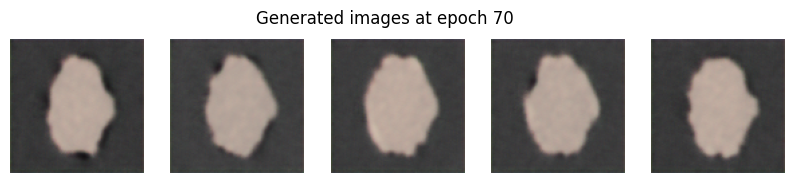

Epoch 71/400 | D loss: 0.0943 | G loss: 3.2015
Epoch 72/400 | D loss: 0.0937 | G loss: 3.2188
Epoch 73/400 | D loss: 0.0933 | G loss: 3.2363
Epoch 74/400 | D loss: 0.0932 | G loss: 3.2526
Epoch 75/400 | D loss: 0.0934 | G loss: 3.2670
Epoch 76/400 | D loss: 0.0943 | G loss: 3.2807
Epoch 77/400 | D loss: 0.0955 | G loss: 3.2899
Epoch 78/400 | D loss: 0.0975 | G loss: 3.2961
Epoch 79/400 | D loss: 0.1004 | G loss: 3.3006
Epoch 80/400 | D loss: 0.1044 | G loss: 3.3003
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


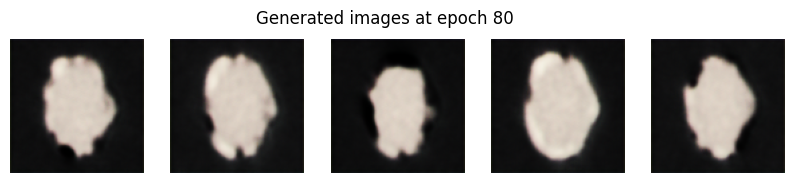

Epoch 81/400 | D loss: 0.1090 | G loss: 3.2982
Epoch 82/400 | D loss: 0.1143 | G loss: 3.2915
Epoch 83/400 | D loss: 0.1204 | G loss: 3.2826
Epoch 84/400 | D loss: 0.1270 | G loss: 3.2711
Epoch 85/400 | D loss: 0.1341 | G loss: 3.2572
Epoch 86/400 | D loss: 0.1424 | G loss: 3.2433
Epoch 87/400 | D loss: 0.1506 | G loss: 3.2264
Epoch 88/400 | D loss: 0.1596 | G loss: 3.2093
Epoch 89/400 | D loss: 0.1689 | G loss: 3.1905
Epoch 90/400 | D loss: 0.1782 | G loss: 3.1712
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


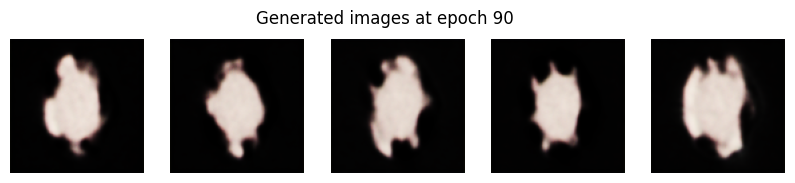

Epoch 91/400 | D loss: 0.1879 | G loss: 3.1504
Epoch 92/400 | D loss: 0.1976 | G loss: 3.1298
Epoch 93/400 | D loss: 0.2071 | G loss: 3.1085
Epoch 94/400 | D loss: 0.2163 | G loss: 3.0873
Epoch 95/400 | D loss: 0.2252 | G loss: 3.0663
Epoch 96/400 | D loss: 0.2339 | G loss: 3.0456
Epoch 97/400 | D loss: 0.2421 | G loss: 3.0250
Epoch 98/400 | D loss: 0.2498 | G loss: 3.0050
Epoch 99/400 | D loss: 0.2572 | G loss: 2.9855
Epoch 100/400 | D loss: 0.2642 | G loss: 2.9663
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


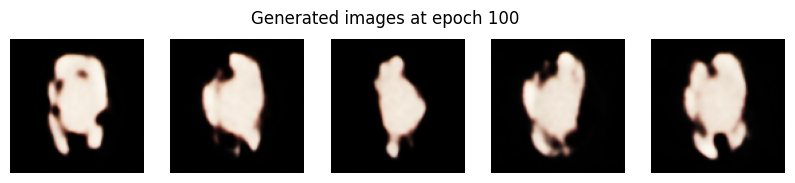

Epoch 101/400 | D loss: 0.2708 | G loss: 2.9475
Epoch 102/400 | D loss: 0.2769 | G loss: 2.9291
Epoch 103/400 | D loss: 0.2828 | G loss: 2.9112
Epoch 104/400 | D loss: 0.2883 | G loss: 2.8937
Epoch 105/400 | D loss: 0.2936 | G loss: 2.8764
Epoch 106/400 | D loss: 0.2986 | G loss: 2.8596
Epoch 107/400 | D loss: 0.3033 | G loss: 2.8433
Epoch 108/400 | D loss: 0.3078 | G loss: 2.8272
Epoch 109/400 | D loss: 0.3122 | G loss: 2.8113
Epoch 110/400 | D loss: 0.3165 | G loss: 2.7958
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


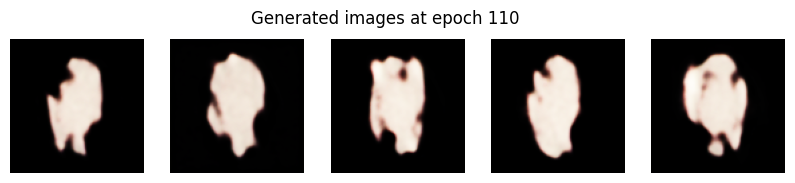

Epoch 111/400 | D loss: 0.3206 | G loss: 2.7807
Epoch 112/400 | D loss: 0.3246 | G loss: 2.7657
Epoch 113/400 | D loss: 0.3284 | G loss: 2.7507
Epoch 114/400 | D loss: 0.3322 | G loss: 2.7362
Epoch 115/400 | D loss: 0.3359 | G loss: 2.7219
Epoch 116/400 | D loss: 0.3396 | G loss: 2.7076
Epoch 117/400 | D loss: 0.3433 | G loss: 2.6935
Epoch 118/400 | D loss: 0.3468 | G loss: 2.6795
Epoch 119/400 | D loss: 0.3503 | G loss: 2.6659
Epoch 120/400 | D loss: 0.3538 | G loss: 2.6524
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


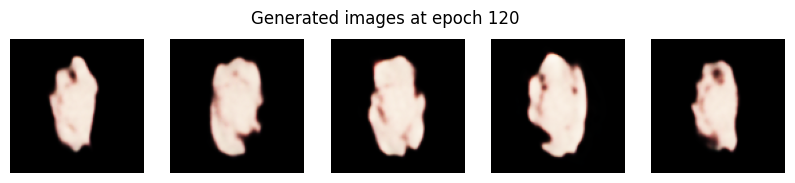

Epoch 121/400 | D loss: 0.3572 | G loss: 2.6390
Epoch 122/400 | D loss: 0.3608 | G loss: 2.6260
Epoch 123/400 | D loss: 0.3643 | G loss: 2.6128
Epoch 124/400 | D loss: 0.3678 | G loss: 2.5994
Epoch 125/400 | D loss: 0.3713 | G loss: 2.5866
Epoch 126/400 | D loss: 0.3749 | G loss: 2.5738
Epoch 127/400 | D loss: 0.3786 | G loss: 2.5610
Epoch 128/400 | D loss: 0.3823 | G loss: 2.5485
Epoch 129/400 | D loss: 0.3859 | G loss: 2.5359
Epoch 130/400 | D loss: 0.3896 | G loss: 2.5235
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


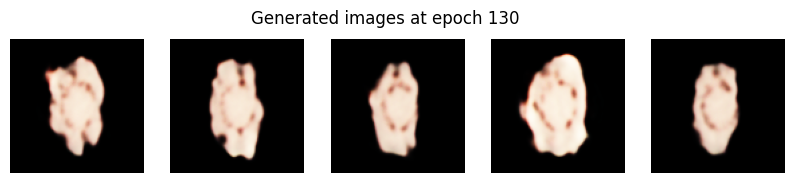

Epoch 131/400 | D loss: 0.3933 | G loss: 2.5111
Epoch 132/400 | D loss: 0.3968 | G loss: 2.4990
Epoch 133/400 | D loss: 0.4005 | G loss: 2.4870
Epoch 134/400 | D loss: 0.4041 | G loss: 2.4750
Epoch 135/400 | D loss: 0.4075 | G loss: 2.4632
Epoch 136/400 | D loss: 0.4110 | G loss: 2.4515
Epoch 137/400 | D loss: 0.4144 | G loss: 2.4400
Epoch 138/400 | D loss: 0.4178 | G loss: 2.4287
Epoch 139/400 | D loss: 0.4210 | G loss: 2.4175
Epoch 140/400 | D loss: 0.4242 | G loss: 2.4065
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


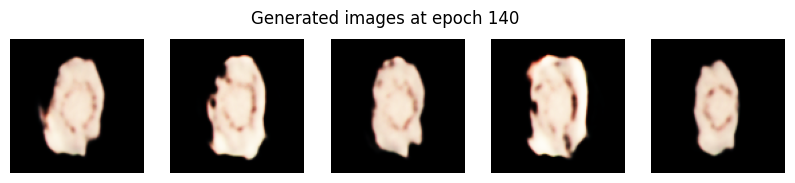

Epoch 141/400 | D loss: 0.4274 | G loss: 2.3957
Epoch 142/400 | D loss: 0.4304 | G loss: 2.3848
Epoch 143/400 | D loss: 0.4334 | G loss: 2.3743
Epoch 144/400 | D loss: 0.4363 | G loss: 2.3638
Epoch 145/400 | D loss: 0.4392 | G loss: 2.3535
Epoch 146/400 | D loss: 0.4420 | G loss: 2.3433
Epoch 147/400 | D loss: 0.4447 | G loss: 2.3332
Epoch 148/400 | D loss: 0.4473 | G loss: 2.3232
Epoch 149/400 | D loss: 0.4499 | G loss: 2.3134
Epoch 150/400 | D loss: 0.4524 | G loss: 2.3037
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


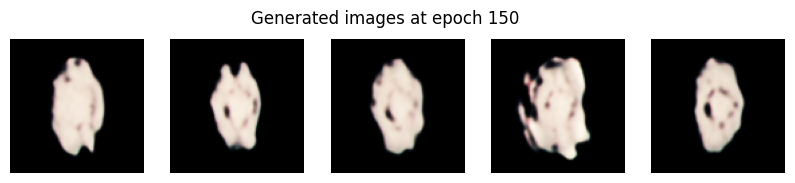

Epoch 151/400 | D loss: 0.4549 | G loss: 2.2941
Epoch 152/400 | D loss: 0.4573 | G loss: 2.2847
Epoch 153/400 | D loss: 0.4597 | G loss: 2.2753
Epoch 154/400 | D loss: 0.4621 | G loss: 2.2661
Epoch 155/400 | D loss: 0.4643 | G loss: 2.2569
Epoch 156/400 | D loss: 0.4666 | G loss: 2.2479
Epoch 157/400 | D loss: 0.4687 | G loss: 2.2390
Epoch 158/400 | D loss: 0.4709 | G loss: 2.2301
Epoch 159/400 | D loss: 0.4729 | G loss: 2.2215
Epoch 160/400 | D loss: 0.4749 | G loss: 2.2129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


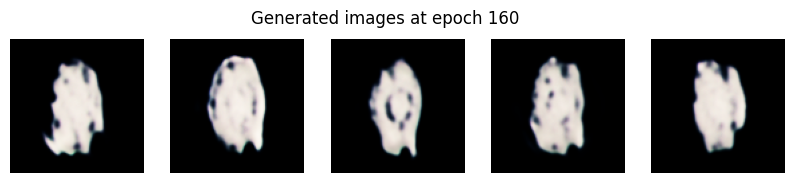

Epoch 161/400 | D loss: 0.4769 | G loss: 2.2045
Epoch 162/400 | D loss: 0.4789 | G loss: 2.1962
Epoch 163/400 | D loss: 0.4808 | G loss: 2.1880
Epoch 164/400 | D loss: 0.4826 | G loss: 2.1800
Epoch 165/400 | D loss: 0.4844 | G loss: 2.1721
Epoch 166/400 | D loss: 0.4861 | G loss: 2.1643
Epoch 167/400 | D loss: 0.4879 | G loss: 2.1566
Epoch 168/400 | D loss: 0.4895 | G loss: 2.1490
Epoch 169/400 | D loss: 0.4912 | G loss: 2.1416
Epoch 170/400 | D loss: 0.4928 | G loss: 2.1343
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


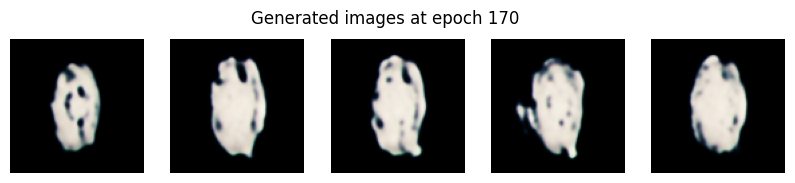

Epoch 171/400 | D loss: 0.4944 | G loss: 2.1270
Epoch 172/400 | D loss: 0.4961 | G loss: 2.1198
Epoch 173/400 | D loss: 0.4978 | G loss: 2.1126
Epoch 174/400 | D loss: 0.4994 | G loss: 2.1055
Epoch 175/400 | D loss: 0.5011 | G loss: 2.0984
Epoch 176/400 | D loss: 0.5028 | G loss: 2.0912
Epoch 177/400 | D loss: 0.5046 | G loss: 2.0842
Epoch 178/400 | D loss: 0.5064 | G loss: 2.0772
Epoch 179/400 | D loss: 0.5083 | G loss: 2.0702
Epoch 180/400 | D loss: 0.5102 | G loss: 2.0632
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


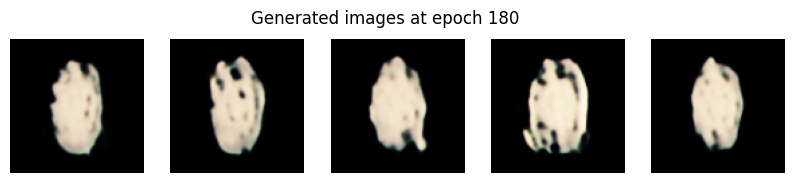

Epoch 181/400 | D loss: 0.5121 | G loss: 2.0563
Epoch 182/400 | D loss: 0.5140 | G loss: 2.0494
Epoch 183/400 | D loss: 0.5159 | G loss: 2.0427
Epoch 184/400 | D loss: 0.5178 | G loss: 2.0359
Epoch 185/400 | D loss: 0.5196 | G loss: 2.0292
Epoch 186/400 | D loss: 0.5214 | G loss: 2.0226
Epoch 187/400 | D loss: 0.5231 | G loss: 2.0161
Epoch 188/400 | D loss: 0.5248 | G loss: 2.0096
Epoch 189/400 | D loss: 0.5264 | G loss: 2.0033
Epoch 190/400 | D loss: 0.5280 | G loss: 1.9970
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


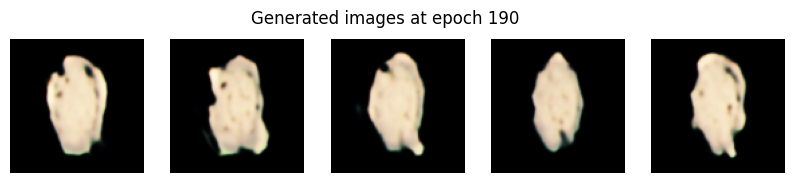

Epoch 191/400 | D loss: 0.5295 | G loss: 1.9910
Epoch 192/400 | D loss: 0.5310 | G loss: 1.9850
Epoch 193/400 | D loss: 0.5324 | G loss: 1.9790
Epoch 194/400 | D loss: 0.5337 | G loss: 1.9732
Epoch 195/400 | D loss: 0.5351 | G loss: 1.9675
Epoch 196/400 | D loss: 0.5364 | G loss: 1.9619
Epoch 197/400 | D loss: 0.5376 | G loss: 1.9563
Epoch 198/400 | D loss: 0.5389 | G loss: 1.9507
Epoch 199/400 | D loss: 0.5402 | G loss: 1.9451
Epoch 200/400 | D loss: 0.5415 | G loss: 1.9397
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


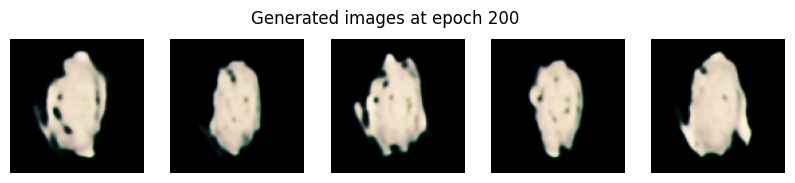

Epoch 201/400 | D loss: 0.5428 | G loss: 1.9342
Epoch 202/400 | D loss: 0.5441 | G loss: 1.9288
Epoch 203/400 | D loss: 0.5455 | G loss: 1.9234
Epoch 204/400 | D loss: 0.5468 | G loss: 1.9181
Epoch 205/400 | D loss: 0.5482 | G loss: 1.9128
Epoch 206/400 | D loss: 0.5495 | G loss: 1.9074
Epoch 207/400 | D loss: 0.5508 | G loss: 1.9022
Epoch 208/400 | D loss: 0.5521 | G loss: 1.8970
Epoch 209/400 | D loss: 0.5535 | G loss: 1.8919
Epoch 210/400 | D loss: 0.5547 | G loss: 1.8868
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


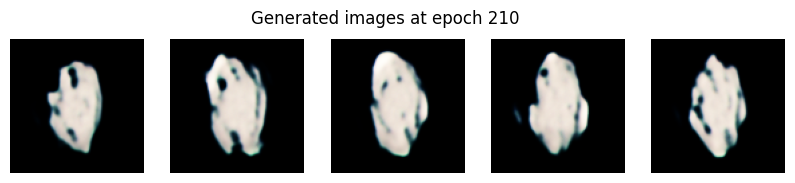

Epoch 211/400 | D loss: 0.5560 | G loss: 1.8818
Epoch 212/400 | D loss: 0.5572 | G loss: 1.8768
Epoch 213/400 | D loss: 0.5584 | G loss: 1.8720
Epoch 214/400 | D loss: 0.5595 | G loss: 1.8672
Epoch 215/400 | D loss: 0.5606 | G loss: 1.8625
Epoch 216/400 | D loss: 0.5616 | G loss: 1.8578
Epoch 217/400 | D loss: 0.5626 | G loss: 1.8532
Epoch 218/400 | D loss: 0.5636 | G loss: 1.8487
Epoch 219/400 | D loss: 0.5645 | G loss: 1.8442
Epoch 220/400 | D loss: 0.5655 | G loss: 1.8398
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


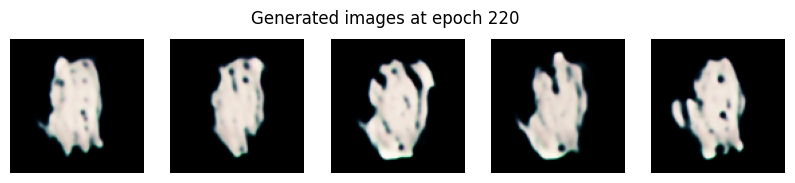

Epoch 221/400 | D loss: 0.5664 | G loss: 1.8354
Epoch 222/400 | D loss: 0.5673 | G loss: 1.8311
Epoch 223/400 | D loss: 0.5683 | G loss: 1.8268
Epoch 224/400 | D loss: 0.5693 | G loss: 1.8225
Epoch 225/400 | D loss: 0.5702 | G loss: 1.8183
Epoch 226/400 | D loss: 0.5713 | G loss: 1.8140
Epoch 227/400 | D loss: 0.5722 | G loss: 1.8098
Epoch 228/400 | D loss: 0.5732 | G loss: 1.8056
Epoch 229/400 | D loss: 0.5742 | G loss: 1.8014
Epoch 230/400 | D loss: 0.5752 | G loss: 1.7973
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


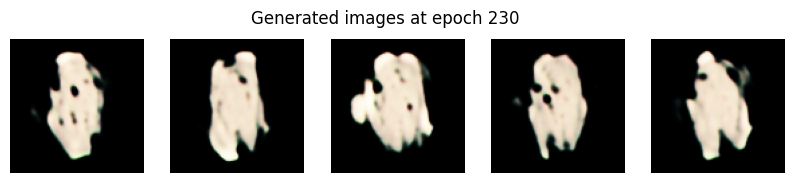

Epoch 231/400 | D loss: 0.5762 | G loss: 1.7931
Epoch 232/400 | D loss: 0.5773 | G loss: 1.7889
Epoch 233/400 | D loss: 0.5783 | G loss: 1.7849
Epoch 234/400 | D loss: 0.5793 | G loss: 1.7808
Epoch 235/400 | D loss: 0.5803 | G loss: 1.7767
Epoch 236/400 | D loss: 0.5813 | G loss: 1.7727
Epoch 237/400 | D loss: 0.5822 | G loss: 1.7687
Epoch 238/400 | D loss: 0.5832 | G loss: 1.7648
Epoch 239/400 | D loss: 0.5842 | G loss: 1.7610
Epoch 240/400 | D loss: 0.5851 | G loss: 1.7571
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


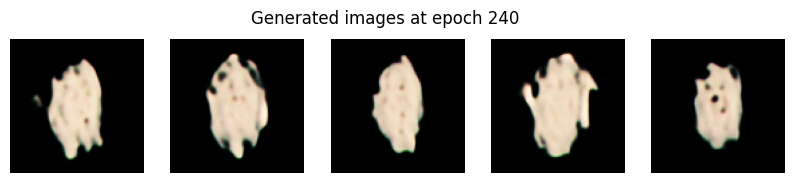

Epoch 241/400 | D loss: 0.5860 | G loss: 1.7534
Epoch 242/400 | D loss: 0.5869 | G loss: 1.7496
Epoch 243/400 | D loss: 0.5877 | G loss: 1.7458
Epoch 244/400 | D loss: 0.5886 | G loss: 1.7421
Epoch 245/400 | D loss: 0.5894 | G loss: 1.7385
Epoch 246/400 | D loss: 0.5903 | G loss: 1.7348
Epoch 247/400 | D loss: 0.5911 | G loss: 1.7313
Epoch 248/400 | D loss: 0.5919 | G loss: 1.7277
Epoch 249/400 | D loss: 0.5927 | G loss: 1.7241
Epoch 250/400 | D loss: 0.5936 | G loss: 1.7206
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


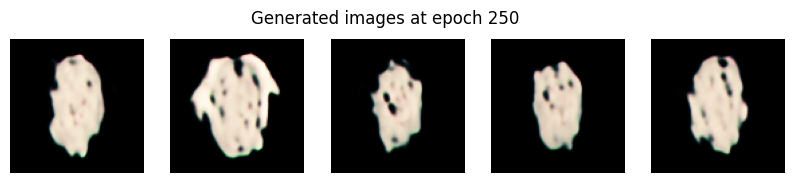

Epoch 251/400 | D loss: 0.5944 | G loss: 1.7170
Epoch 252/400 | D loss: 0.5952 | G loss: 1.7135
Epoch 253/400 | D loss: 0.5961 | G loss: 1.7100
Epoch 254/400 | D loss: 0.5969 | G loss: 1.7065
Epoch 255/400 | D loss: 0.5978 | G loss: 1.7030
Epoch 256/400 | D loss: 0.5987 | G loss: 1.6996
Epoch 257/400 | D loss: 0.5995 | G loss: 1.6961
Epoch 258/400 | D loss: 0.6004 | G loss: 1.6927
Epoch 259/400 | D loss: 0.6012 | G loss: 1.6893
Epoch 260/400 | D loss: 0.6020 | G loss: 1.6860
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


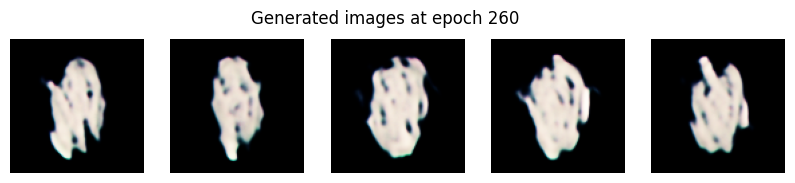

Epoch 261/400 | D loss: 0.6028 | G loss: 1.6826
Epoch 262/400 | D loss: 0.6036 | G loss: 1.6793
Epoch 263/400 | D loss: 0.6044 | G loss: 1.6760
Epoch 264/400 | D loss: 0.6051 | G loss: 1.6729
Epoch 265/400 | D loss: 0.6059 | G loss: 1.6698
Epoch 266/400 | D loss: 0.6066 | G loss: 1.6666
Epoch 267/400 | D loss: 0.6072 | G loss: 1.6636
Epoch 268/400 | D loss: 0.6079 | G loss: 1.6606
Epoch 269/400 | D loss: 0.6086 | G loss: 1.6576
Epoch 270/400 | D loss: 0.6092 | G loss: 1.6546
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


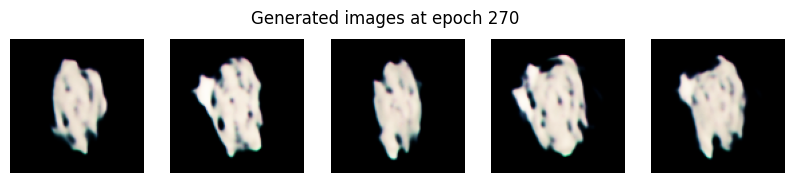

Epoch 271/400 | D loss: 0.6099 | G loss: 1.6517
Epoch 272/400 | D loss: 0.6105 | G loss: 1.6487
Epoch 273/400 | D loss: 0.6112 | G loss: 1.6458
Epoch 274/400 | D loss: 0.6119 | G loss: 1.6429
Epoch 275/400 | D loss: 0.6125 | G loss: 1.6399
Epoch 276/400 | D loss: 0.6132 | G loss: 1.6370
Epoch 277/400 | D loss: 0.6139 | G loss: 1.6342
Epoch 278/400 | D loss: 0.6146 | G loss: 1.6313
Epoch 279/400 | D loss: 0.6153 | G loss: 1.6284
Epoch 280/400 | D loss: 0.6160 | G loss: 1.6255
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


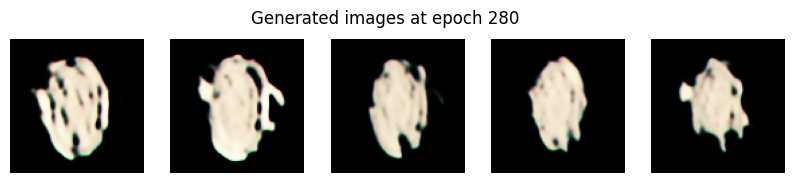

Epoch 281/400 | D loss: 0.6167 | G loss: 1.6227
Epoch 282/400 | D loss: 0.6174 | G loss: 1.6199
Epoch 283/400 | D loss: 0.6181 | G loss: 1.6171
Epoch 284/400 | D loss: 0.6187 | G loss: 1.6143
Epoch 285/400 | D loss: 0.6194 | G loss: 1.6115
Epoch 286/400 | D loss: 0.6201 | G loss: 1.6088
Epoch 287/400 | D loss: 0.6207 | G loss: 1.6060
Epoch 288/400 | D loss: 0.6214 | G loss: 1.6033
Epoch 289/400 | D loss: 0.6220 | G loss: 1.6006
Epoch 290/400 | D loss: 0.6227 | G loss: 1.5980
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


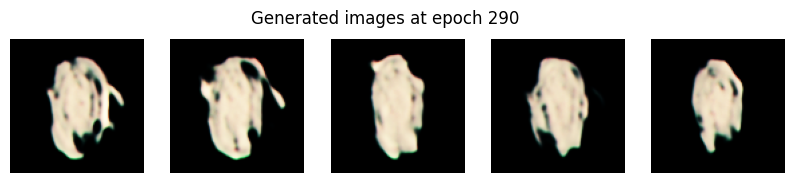

Epoch 291/400 | D loss: 0.6233 | G loss: 1.5953
Epoch 292/400 | D loss: 0.6239 | G loss: 1.5927
Epoch 293/400 | D loss: 0.6245 | G loss: 1.5901
Epoch 294/400 | D loss: 0.6252 | G loss: 1.5875
Epoch 295/400 | D loss: 0.6258 | G loss: 1.5850
Epoch 296/400 | D loss: 0.6264 | G loss: 1.5824
Epoch 297/400 | D loss: 0.6270 | G loss: 1.5798
Epoch 298/400 | D loss: 0.6276 | G loss: 1.5773
Epoch 299/400 | D loss: 0.6282 | G loss: 1.5748
Epoch 300/400 | D loss: 0.6288 | G loss: 1.5723
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


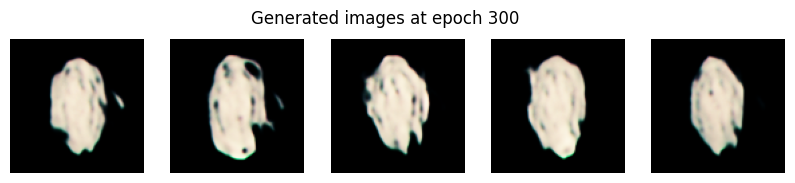

Epoch 301/400 | D loss: 0.6294 | G loss: 1.5698
Epoch 302/400 | D loss: 0.6300 | G loss: 1.5673
Epoch 303/400 | D loss: 0.6306 | G loss: 1.5648
Epoch 304/400 | D loss: 0.6312 | G loss: 1.5623
Epoch 305/400 | D loss: 0.6317 | G loss: 1.5599
Epoch 306/400 | D loss: 0.6323 | G loss: 1.5575
Epoch 307/400 | D loss: 0.6328 | G loss: 1.5551
Epoch 308/400 | D loss: 0.6333 | G loss: 1.5527
Epoch 309/400 | D loss: 0.6339 | G loss: 1.5503
Epoch 310/400 | D loss: 0.6344 | G loss: 1.5480
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


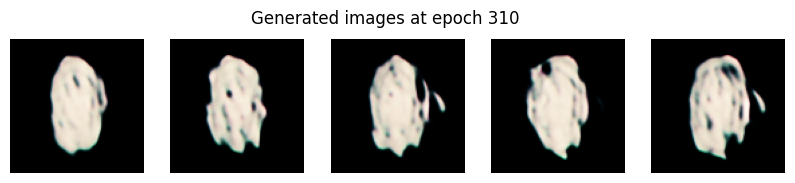

Epoch 311/400 | D loss: 0.6350 | G loss: 1.5456
Epoch 312/400 | D loss: 0.6355 | G loss: 1.5433
Epoch 313/400 | D loss: 0.6360 | G loss: 1.5410
Epoch 314/400 | D loss: 0.6365 | G loss: 1.5387
Epoch 315/400 | D loss: 0.6369 | G loss: 1.5365
Epoch 316/400 | D loss: 0.6374 | G loss: 1.5342
Epoch 317/400 | D loss: 0.6379 | G loss: 1.5320
Epoch 318/400 | D loss: 0.6384 | G loss: 1.5298
Epoch 319/400 | D loss: 0.6389 | G loss: 1.5276
Epoch 320/400 | D loss: 0.6394 | G loss: 1.5254
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


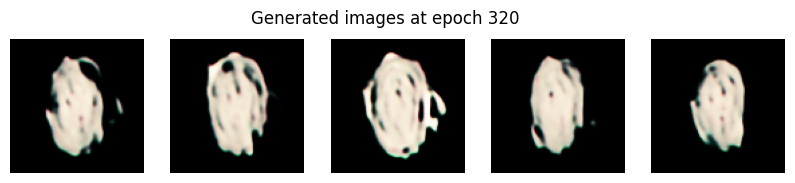

Epoch 321/400 | D loss: 0.6399 | G loss: 1.5232
Epoch 322/400 | D loss: 0.6404 | G loss: 1.5210
Epoch 323/400 | D loss: 0.6409 | G loss: 1.5188
Epoch 324/400 | D loss: 0.6414 | G loss: 1.5167
Epoch 325/400 | D loss: 0.6418 | G loss: 1.5145
Epoch 326/400 | D loss: 0.6423 | G loss: 1.5124
Epoch 327/400 | D loss: 0.6428 | G loss: 1.5102
Epoch 328/400 | D loss: 0.6433 | G loss: 1.5081
Epoch 329/400 | D loss: 0.6438 | G loss: 1.5060
Epoch 330/400 | D loss: 0.6443 | G loss: 1.5039
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


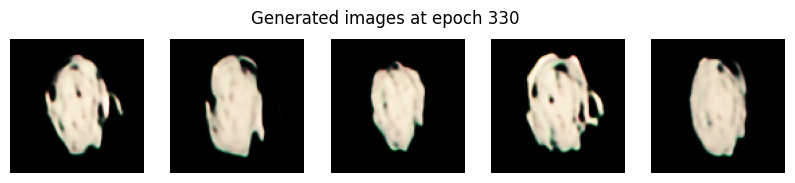

Epoch 331/400 | D loss: 0.6448 | G loss: 1.5018
Epoch 332/400 | D loss: 0.6452 | G loss: 1.4997
Epoch 333/400 | D loss: 0.6457 | G loss: 1.4976
Epoch 334/400 | D loss: 0.6462 | G loss: 1.4956
Epoch 335/400 | D loss: 0.6466 | G loss: 1.4936
Epoch 336/400 | D loss: 0.6471 | G loss: 1.4916
Epoch 337/400 | D loss: 0.6475 | G loss: 1.4896
Epoch 338/400 | D loss: 0.6479 | G loss: 1.4876
Epoch 339/400 | D loss: 0.6484 | G loss: 1.4856
Epoch 340/400 | D loss: 0.6488 | G loss: 1.4837
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


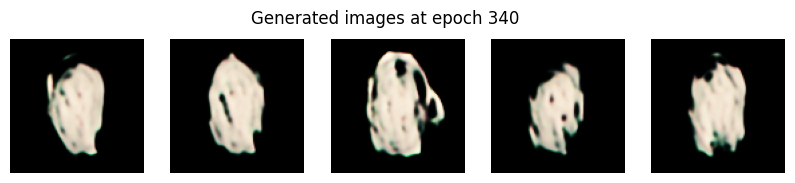

Epoch 341/400 | D loss: 0.6492 | G loss: 1.4817
Epoch 342/400 | D loss: 0.6496 | G loss: 1.4798
Epoch 343/400 | D loss: 0.6500 | G loss: 1.4778
Epoch 344/400 | D loss: 0.6504 | G loss: 1.4759
Epoch 345/400 | D loss: 0.6508 | G loss: 1.4741
Epoch 346/400 | D loss: 0.6512 | G loss: 1.4722
Epoch 347/400 | D loss: 0.6516 | G loss: 1.4703
Epoch 348/400 | D loss: 0.6520 | G loss: 1.4685
Epoch 349/400 | D loss: 0.6523 | G loss: 1.4667
Epoch 350/400 | D loss: 0.6527 | G loss: 1.4649
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


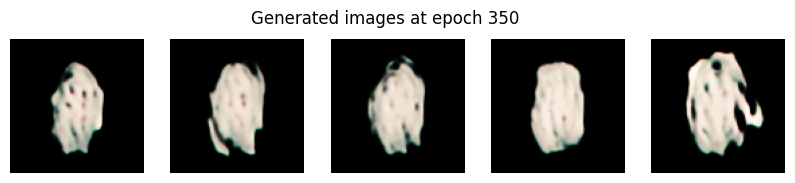

Epoch 351/400 | D loss: 0.6530 | G loss: 1.4630
Epoch 352/400 | D loss: 0.6534 | G loss: 1.4612
Epoch 353/400 | D loss: 0.6537 | G loss: 1.4595
Epoch 354/400 | D loss: 0.6540 | G loss: 1.4577
Epoch 355/400 | D loss: 0.6544 | G loss: 1.4560
Epoch 356/400 | D loss: 0.6547 | G loss: 1.4542
Epoch 357/400 | D loss: 0.6550 | G loss: 1.4525
Epoch 358/400 | D loss: 0.6553 | G loss: 1.4508
Epoch 359/400 | D loss: 0.6556 | G loss: 1.4491
Epoch 360/400 | D loss: 0.6559 | G loss: 1.4474
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


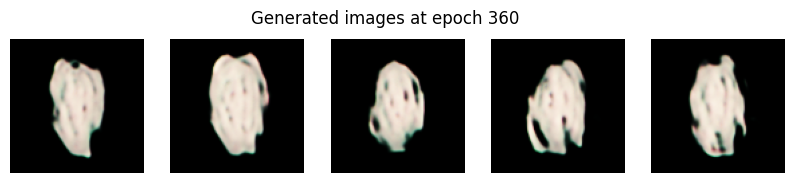

Epoch 361/400 | D loss: 0.6562 | G loss: 1.4458
Epoch 362/400 | D loss: 0.6565 | G loss: 1.4441
Epoch 363/400 | D loss: 0.6567 | G loss: 1.4425
Epoch 364/400 | D loss: 0.6570 | G loss: 1.4408
Epoch 365/400 | D loss: 0.6573 | G loss: 1.4392
Epoch 366/400 | D loss: 0.6575 | G loss: 1.4376
Epoch 367/400 | D loss: 0.6578 | G loss: 1.4361
Epoch 368/400 | D loss: 0.6580 | G loss: 1.4345
Epoch 369/400 | D loss: 0.6582 | G loss: 1.4329
Epoch 370/400 | D loss: 0.6585 | G loss: 1.4314
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


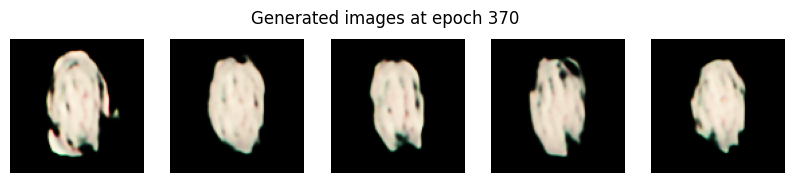

Epoch 371/400 | D loss: 0.6587 | G loss: 1.4298
Epoch 372/400 | D loss: 0.6589 | G loss: 1.4283
Epoch 373/400 | D loss: 0.6592 | G loss: 1.4268
Epoch 374/400 | D loss: 0.6594 | G loss: 1.4253
Epoch 375/400 | D loss: 0.6596 | G loss: 1.4238
Epoch 376/400 | D loss: 0.6598 | G loss: 1.4223
Epoch 377/400 | D loss: 0.6600 | G loss: 1.4208
Epoch 378/400 | D loss: 0.6602 | G loss: 1.4194
Epoch 379/400 | D loss: 0.6604 | G loss: 1.4179
Epoch 380/400 | D loss: 0.6607 | G loss: 1.4164
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


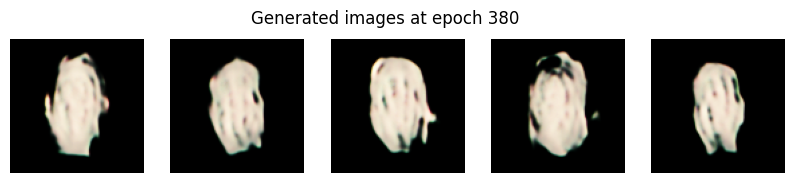

Epoch 381/400 | D loss: 0.6609 | G loss: 1.4149
Epoch 382/400 | D loss: 0.6611 | G loss: 1.4135
Epoch 383/400 | D loss: 0.6613 | G loss: 1.4120
Epoch 384/400 | D loss: 0.6615 | G loss: 1.4105
Epoch 385/400 | D loss: 0.6618 | G loss: 1.4091
Epoch 386/400 | D loss: 0.6620 | G loss: 1.4076
Epoch 387/400 | D loss: 0.6623 | G loss: 1.4062
Epoch 388/400 | D loss: 0.6625 | G loss: 1.4048
Epoch 389/400 | D loss: 0.6627 | G loss: 1.4033
Epoch 390/400 | D loss: 0.6630 | G loss: 1.4019
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


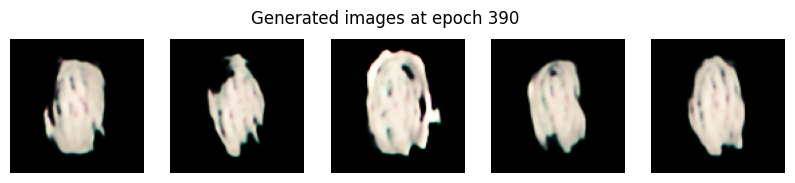

Epoch 391/400 | D loss: 0.6632 | G loss: 1.4004
Epoch 392/400 | D loss: 0.6635 | G loss: 1.3990
Epoch 393/400 | D loss: 0.6637 | G loss: 1.3976
Epoch 394/400 | D loss: 0.6640 | G loss: 1.3962
Epoch 395/400 | D loss: 0.6642 | G loss: 1.3948
Epoch 396/400 | D loss: 0.6645 | G loss: 1.3934
Epoch 397/400 | D loss: 0.6648 | G loss: 1.3920
Epoch 398/400 | D loss: 0.6650 | G loss: 1.3906
Epoch 399/400 | D loss: 0.6653 | G loss: 1.3892
Epoch 400/400 | D loss: 0.6656 | G loss: 1.3878
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


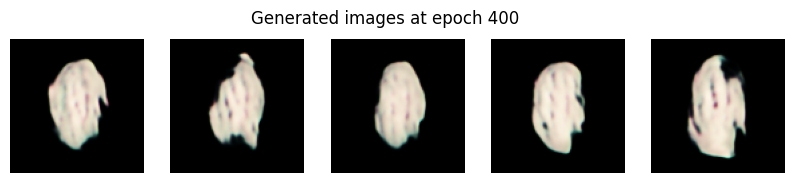

In [16]:
best_dropout = 0.1
best_lr = 1e-5
epochs = 400  

generator_final = generator_tuning(dropout_rate=best_dropout)
discriminator_final = discriminator_tuning(dropout_rate=best_dropout)

discriminator_final.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=best_lr, beta_1=0.5)
)

discriminator_final.trainable = False
gan_input = tf.keras.Input(shape=(noise_dim,))
gan_output = discriminator_final(generator_final(gan_input))
gan_final = tf.keras.Model(gan_input, gan_output)
gan_final.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=best_lr, beta_1=0.5)
)

losses_d_final = []
losses_g_final = []

for epoch in range(epochs):
    for real_imgs in train_ds:
        if real_imgs.shape[0] != batch_size:
            continue  

        noise = get_random_noise(batch_size, noise_dim)
        fake_imgs = generator_final.predict(noise, verbose=0)

        real_labels = np.ones((batch_size, 1))
        fake_labels = np.zeros((batch_size, 1))

        discriminator_final.trainable = True
        d_loss_real = discriminator_final.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator_final.train_on_batch(fake_imgs, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        noise = get_random_noise(batch_size, noise_dim)
        misleading_labels = np.ones((batch_size, 1))

        discriminator_final.trainable = False
        g_loss = gan_final.train_on_batch(noise, misleading_labels)

    losses_d_final.append(float(d_loss))
    losses_g_final.append(float(g_loss))

    print(f"Epoch {epoch+1}/{epochs} | D loss: {float(d_loss):.4f} | G loss: {float(g_loss):.4f}")

    if (epoch + 1) % 10 == 0:
        show_generator_results(generator_final, epoch + 1)

In [22]:
generator_final.save("generator_tuning.keras")
discriminator_final.save("discriminator_tuning.keras")

In [23]:
history = {
    "losses_d": losses_d_final,
    "losses_g": losses_g_final
}

with open("history_tuning.json", "w") as f:
    json.dump(history, f)

In [46]:
generator = load_model('generator_baseline.keras')
fake_images = generator.predict(noise, verbose=0)
generator2 = load_model('generator_modif.keras')
fake_images2 = generator2.predict(noise, verbose = 0)
generator3 = load_model("generator_tuning.keras")
fake_images3 = generator3.predict(noise, verbose = 0)

# Evaluation Baseline VS Modified VS Tuning


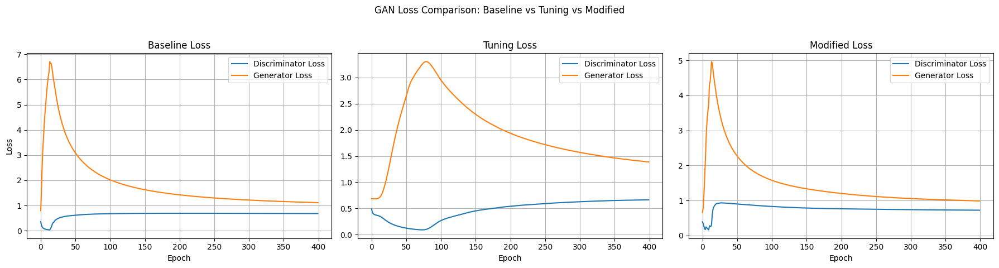

In [48]:
with open("baseline_history.json", "r") as f:
    baseline_history = json.load(f)

with open("history_tuning.json", "r") as f:
    tuning_history = json.load(f)

with open("modif_history.json", "r") as f:
    modif_history = json.load(f)

plt.figure(figsize=(18, 5))  

plt.subplot(1, 3, 1)
plt.plot(baseline_history["d_loss"], label="Discriminator Loss")
plt.plot(baseline_history["g_loss"], label="Generator Loss")
plt.title("Baseline Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(tuning_history["losses_d"], label="Discriminator Loss")
plt.plot(tuning_history["losses_g"], label="Generator Loss")
plt.title("Tuning Loss")
plt.xlabel("Epoch")
plt.legend()
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(modif_history["d_loss"], label="Discriminator Loss")
plt.plot(modif_history["g_loss"], label="Generator Loss")
plt.title("Modified Loss")
plt.xlabel("Epoch")
plt.legend()
plt.grid(True)

plt.suptitle("GAN Loss Comparison: Baseline vs Tuning vs Modified")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Ketiga plot menyajikan perbandingan loss untuk Diskriminator dan Generator dalam model GAN pada tiga skenario berbeda: Baseline, Tuning, dan Modified.

Pada skenario Baseline, Diskriminator menunjukkan loss yang rendah dan stabil setelah epoch awal, mengindikasikan kemampuannya yang baik dalam membedakan gambar. Sementara itu, Generator mengalami loss tinggi di awal yang kemudian menurun tajam, menunjukkan bahwa ia cepat belajar menghasilkan gambar realistis.

Untuk Tuning, Diskriminator mengalami penurunan loss yang drastis di awal lalu perlahan meningkat, menandakan kemampuannya yang sangat baik di awal namun mungkin kemudian "dikejar" oleh Generator. Sebaliknya, Generator menunjukkan lonjakan loss yang tinggi di awal sebelum perlahan menurun, mengindikasikan kesulitan besar di fase awal pembelajaran.

Terakhir, pada skenario Modified, loss Diskriminator menyerupai Baseline, yaitu rendah dan stabil, menunjukkan kinerja yang konsisten. Namun, Generator pada skenario ini menampilkan lonjakan loss awal yang lebih tinggi dibandingkan Baseline, namun kemudian menurun drastis, menunjukkan tantangan awal yang lebih besar tetapi diikuti dengan pembelajaran yang efektif untuk menipu Diskriminator.


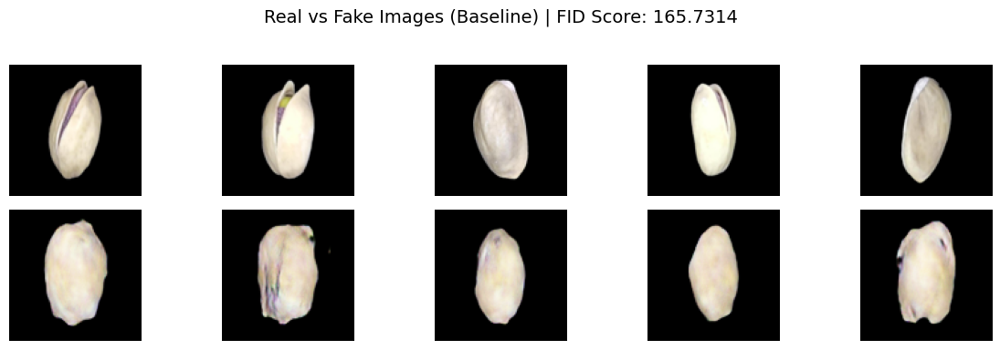

165.73137883993635

In [49]:
show_comparison(real_images, fake_images, title = "Baseline")

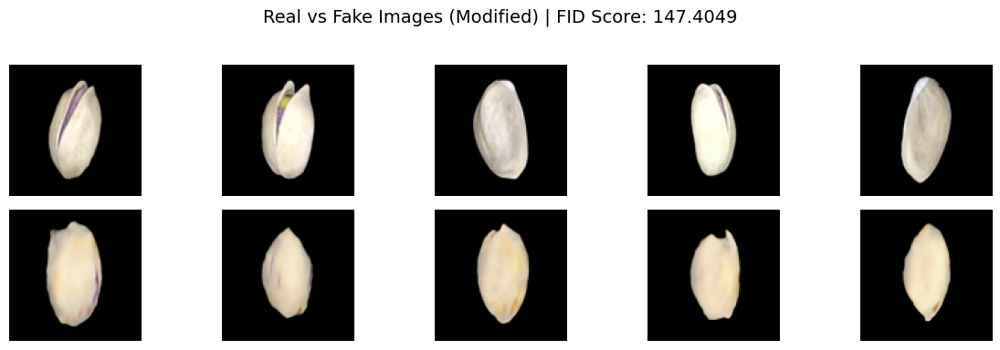

147.40491579375072

In [50]:
show_comparison(real_images, fake_images2, title = "Modified")

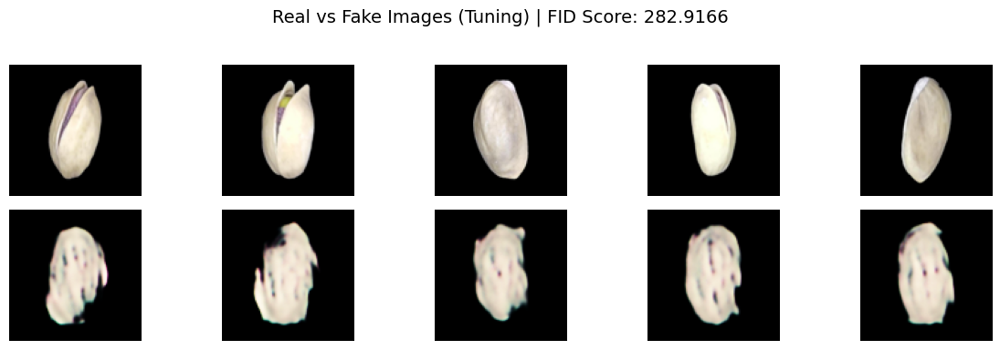

282.91664518784603

In [51]:
show_comparison(real_images, fake_images3, title = "Tuning")

Berdasarkan hasil evaluasi menggunakan Frechet Inception Distance (FID), model baseline berhasil mencapai skor FID sebesar 164.05. Nilai ini menunjukkan bahwa gambar-gambar yang dihasilkan oleh generator baseline memiliki distribusi fitur yang lebih mendekati gambar nyata. Artinya, model ini mampu menghasilkan gambar yang lebih realistis dan stabil tanpa perlu penyesuaian parameter lebih lanjut.

Lalu untuk Modified model sendiri memiliki nilai FID yang baik yakni 147.40 yang jauh lebih rendah daripada baseline, ini menunjukkan bahwa model ini mampu menghasilkan gambar yang lebih realistis dan stabil

Sebaliknya, model hasil tuning dengan dropout sebesar 0.1 dan learning rate 1e-5 justru memperoleh FID yang lebih tinggi, yaitu 282.91. Meskipun tuning dilakukan dengan harapan meningkatkan performa, hasil ini menunjukkan bahwa konfigurasi tersebut belum memberikan perbaikan. Hal ini bisa disebabkan oleh kombinasi dropout dan learning rate yang belum optimal

Oleh karena itu jika membandingkan antara model Baseline, Modified, dan Tuning maka bisa disimpulkan bahwa Modified merupakan best model


# Video Penjelasan:

https://drive.google.com/file/d/1KkvXSVQZ3fo8BUjp_iZ7zjk8P63-ldKU/view?usp=drive_link
